# TABLE OF CONTENTS

1.Problem Statement

2.Exploratory Data Analysis

3.Feature Engineering

4.Statistical tests

5.PCA

6.Model Building and comparison of ML Models

7.Clustering

8.Business insights and Recommendations


# 1.PROBLEM STATEMENT

Though the rise of E-Commerce tradition over the past few years has created potential in the marketplace, most of the visitors still do not complete their online shopping process due to various reasons. This leads the online vendors the need for solutions to prevent the loss of their revenues. 

Based on this information, I have derived two problem statements, which we aim to address in this project:
    
1. The factors that influence the visitor’s intention on the online shopping environment.

2. Machine learning models to predict the likelihood of their revenue generation based on the relevant factors.

**Data Description:**

To classify consumer on-site behaviour, a training dataset is collected from an e-commerce website. This dataset is consisting of a combination of both user data collected by the e-commerce and Google Analytics metrics showing statistical data about the pages. The dataset consists of feature vectors belonging to 12330 sessions. The dataset was formed so that each session would belong to a different user in a one year to avoid any tendency to a specific campaign, special day, user profile, or period.

The data used in this analysis is an Online Shoppers Purchasing Intention data set provided on the UC Irvine’s Machine Learning Repository. The primary purpose of the data set is to predict the purchasing intentions of a visitor to this particular store’s website. The variables in the data set can be split into these three categories: data related to the page that the user lands on, bounce rate and exit rate metrics, and user visit data.
The dataset was formed so that each session would belong to a different user in a specific time period to avoid any tendency to a specific campaign, special day, user profile, or period


# Importing Required Libraries

In [1]:
import seaborn as sns
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE

from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score, GridSearchCV, train_test_split, KFold
from sklearn.metrics import recall_score, roc_auc_score

In C:\Users\user\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\classic.mplstyle: 
The text.latex.preview rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\user\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\classic.mplstyle: 
The mathtext.fallback_to_cm rcparam was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\user\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\classic.mplstyle: Support for setting the 'mathtext.fallback_to_cm' rcParam is deprecated since 3.3 and will be removed two minor releases later; use 'mathtext.fallback : 'cm' instead.
In C:\Users\user\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\classic.mplstyle: 
The validate_bool_maybe_none function was deprecated in Matplotlib 3.3 and will be removed two minor releases later.
In C:\Users\user\Anaconda3\lib\site-packages\matplotlib\mpl-data\stylelib\classic.mplstyle: 
The savefig.jpeg_quality rc

In [2]:
import pandas as pd
import numpy as np

import statsmodels.api as sm
import scipy.stats as st
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn import metrics
import seaborn as sns
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
from scipy.stats import shapiro,mannwhitneyu,chi2_contingency

from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

from IPython.display import Image
from sklearn.externals.six import StringIO
from sklearn.tree import export_graphviz
import pydotplus
import imblearn
import lightgbm
import hyperopt

import warnings 
warnings.filterwarnings('ignore')

C:\Users\user\Anaconda3\lib\site-packages\sklearn\externals\six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)


# Reading the data set

In [3]:
df = pd.read_csv('C:\\Users\\user\\Capstone Project\\Capstone Projects\\online_shoppers_intention.csv')

In [4]:
df.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


# Shape of Data

In [9]:
df.shape

(12330, 18)

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
Administrative             12330 non-null int64
Administrative_Duration    12330 non-null float64
Informational              12330 non-null int64
Informational_Duration     12330 non-null float64
ProductRelated             12330 non-null int64
ProductRelated_Duration    12330 non-null float64
BounceRates                12330 non-null float64
ExitRates                  12330 non-null float64
PageValues                 12330 non-null float64
SpecialDay                 12330 non-null float64
Month                      12330 non-null object
OperatingSystems           12330 non-null int64
Browser                    12330 non-null int64
Region                     12330 non-null int64
TrafficType                12330 non-null int64
VisitorType                12330 non-null object
Weekend                    12330 non-null bool
Revenue                    12330 non-null bool
dtypes: bool(

# Number of null Values

In [11]:
df.isnull().sum()

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

###### No null values in this dataset.

# Descriptive Statistics

In [12]:
df.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427,2.124006,2.357097,3.147364,4.069586
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917,0.911325,1.717277,2.401591,4.025169
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157213,0.016813,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


In [13]:
df.describe(include=['object','bool'])

,Month,VisitorType,Weekend,Revenue
count,12330,12330,12330,12330
unique,10,3,2,2
top,May,Returning_Visitor,False,False
freq,3364,10551,9462,10422


In [14]:
df.skew()

Administrative             1.960357
Administrative_Duration    5.615719
Informational              4.036464
Informational_Duration     7.579185
ProductRelated             4.341516
ProductRelated_Duration    7.263228
BounceRates                2.947855
ExitRates                  2.148789
PageValues                 6.382964
SpecialDay                 3.302667
OperatingSystems           2.066285
Browser                    3.242350
Region                     0.983549
TrafficType                1.962987
Weekend                    1.265962
Revenue                    1.909509
dtype: float64

In [15]:
df.kurtosis()

Administrative               4.701146
Administrative_Duration     50.556739
Informational               26.932266
Informational_Duration      76.316853
ProductRelated              31.211707
ProductRelated_Duration    137.174164
BounceRates                  7.723159
ExitRates                    4.017035
PageValues                  65.635694
SpecialDay                   9.913659
OperatingSystems            10.456843
Browser                     12.746733
Region                      -0.148680
TrafficType                  3.479711
Weekend                     -0.397404
Revenue                      1.646493
dtype: float64

# 2.EXPLORATORY DATA ANALYSIS

In [16]:
num_col=['Administrative_Duration',
       'Informational_Duration', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues']

# Boxplot of all columns

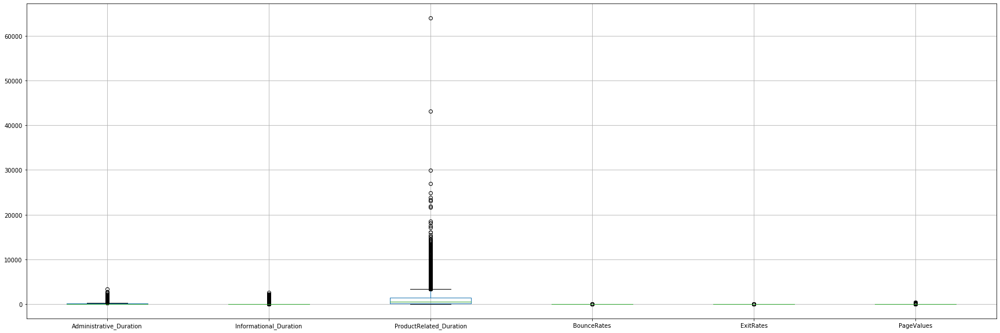

In [42]:
plt.figure(figsize=(30,10))
df.boxplot(column=num_col)

# Distribution of all columns with respect to Revenue

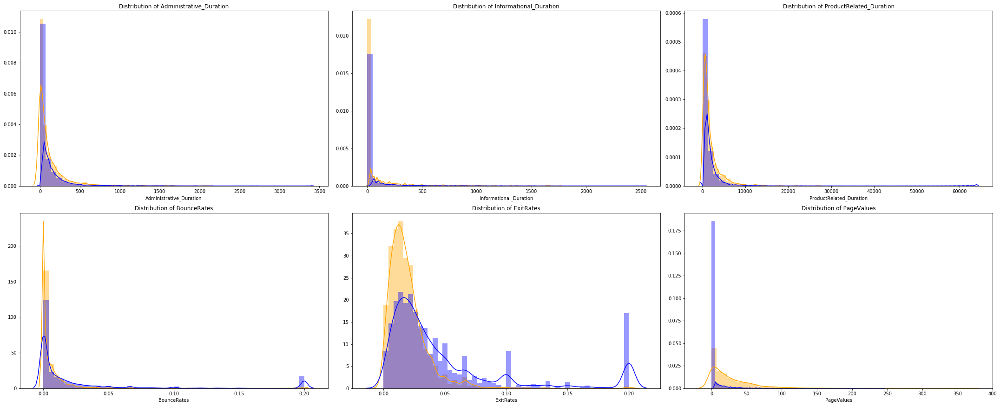

In [13]:
plt.figure(figsize=(30,30))
plot_number = 0
for i in num_col:
    plot_number = plot_number + 1
    ax = plt.subplot(5, 3, plot_number)
    sns.distplot(df[df.Revenue == True][i],color='orange', ax=ax)
    sns.distplot(df[df.Revenue == False][i],color='blue', ax=ax)
    ax.set_title('Distribution of '+ i)
plt.tight_layout()

###### Most of the columns are right skewed. Hence, we will apply transformations later to reduce the same.

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002372043CE08>,
      dtype=object)

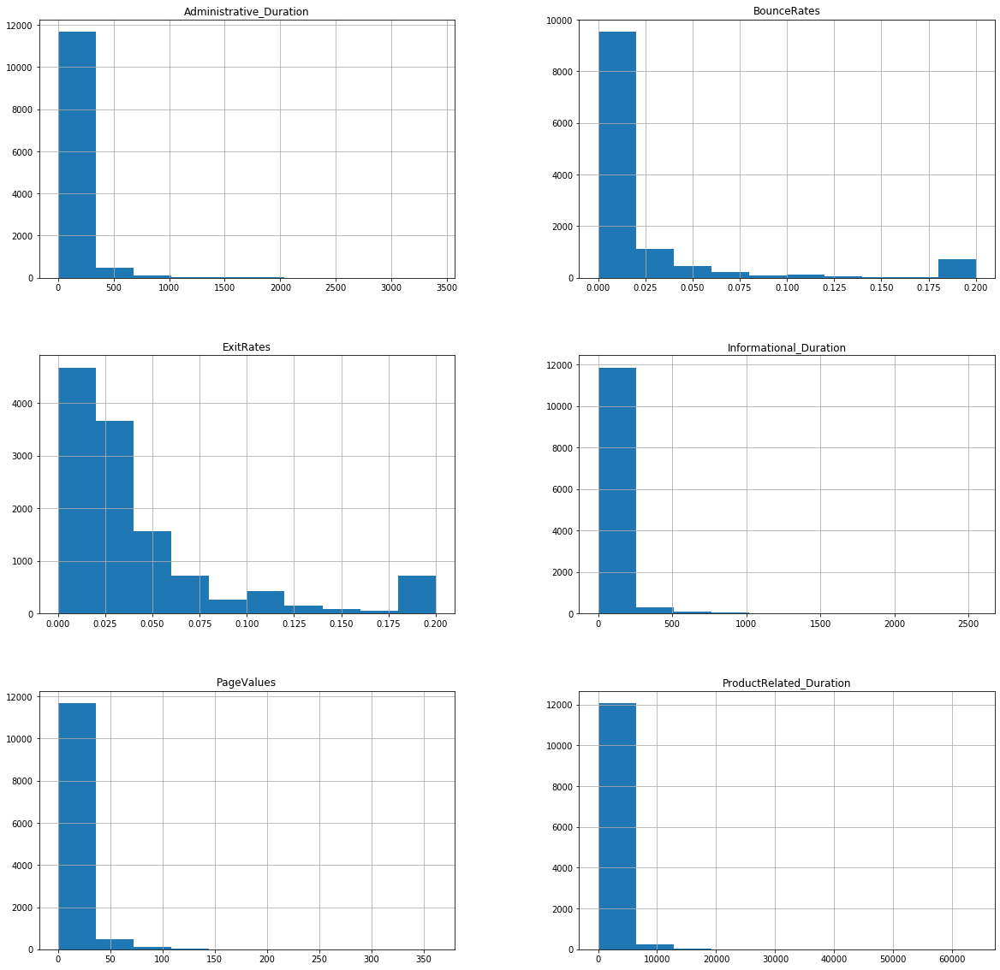

In [14]:
df.hist(column=num_col,figsize=(20,20))

# Class Imbalance 

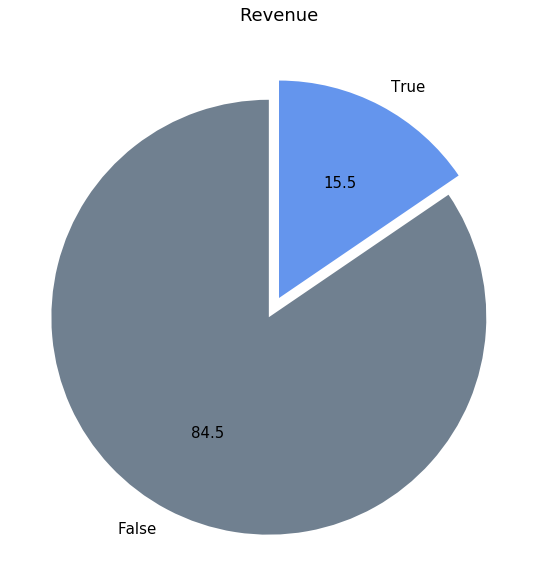

In [15]:
plt.figure(figsize=(10,10))
df['Revenue'].value_counts().plot(kind='pie',autopct='%1.1f', textprops={'fontsize': 15},startangle=90,explode =(0.1,0),colors=['slategray','cornflowerblue'])
plt.title('Revenue', fontsize = 18)
plt.ylabel('')
plt.savefig('Class.jpeg',dpi=150)

As shown in the above Figure, 84.5% of the total values of the target class fit in to the ‘False’ category, signifying that the customer do not generate revenue or doesn’t complete the transaction. The remaining 15.5% in the ‘True’ category, suggests that revenue is generated by them. Since, for the purpose of our study, we are mainly considering the revenue generation, it can be observed that there is an imbalance within the target variable. Given the extreme imbalance, we will have to implement measure to sample the data correctly in order to build a good ML model. 

# Univariate Analysis

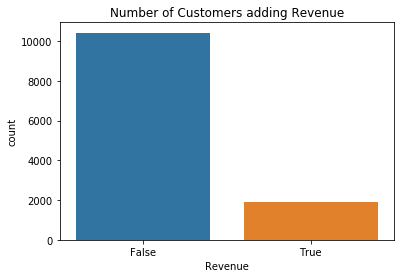

In [16]:
plt.title('Number of Customers adding Revenue')
sns.countplot(df['Revenue'])

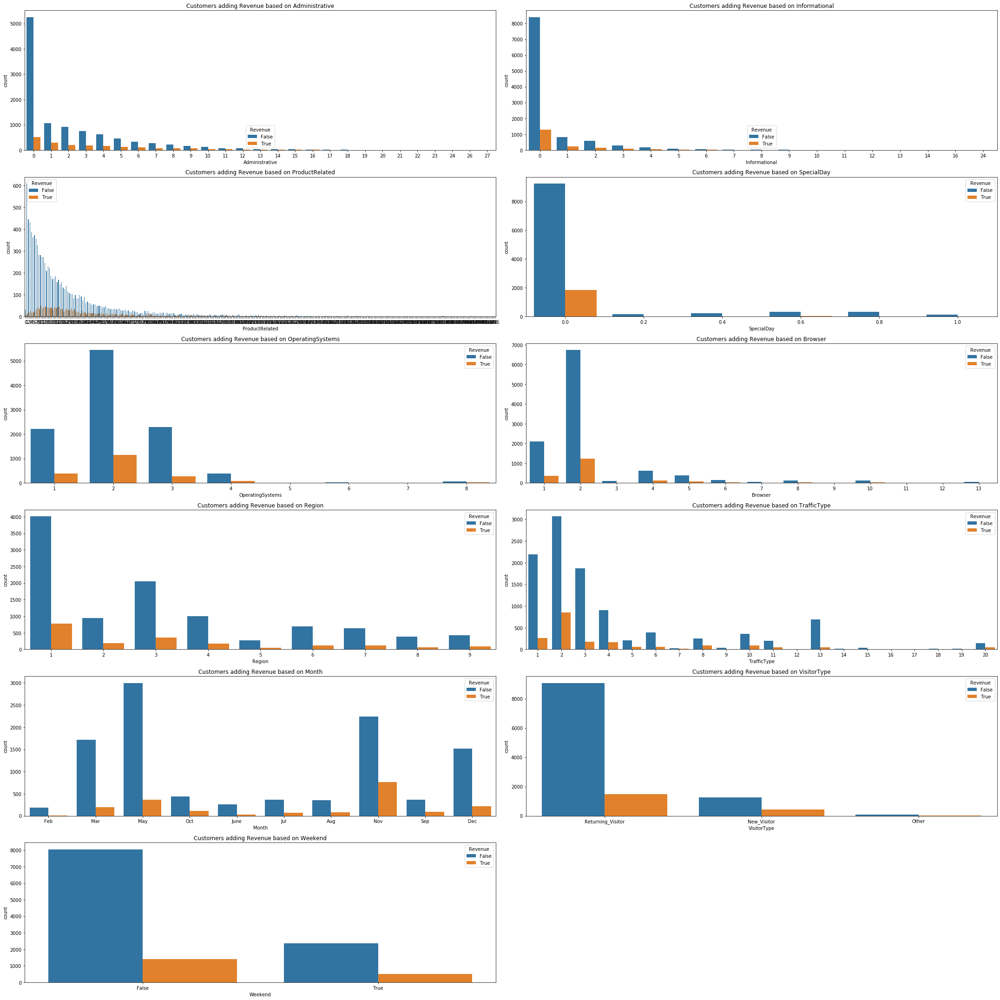

In [17]:
column1l=['Administrative','Informational','ProductRelated','SpecialDay','OperatingSystems','Browser','Region','TrafficType','Month','VisitorType','Weekend']    
plt.figure(figsize=(30,30))
plot_number = 0
for i in column1l:
    plot_number = plot_number + 1
    ax = plt.subplot(6, 2, plot_number,adjustable='datalim')
    sns.countplot(df[i],hue=df['Revenue'])
    ax.set_title('Customers adding Revenue based on '+ i,fontdict=None)
    plt.tight_layout()

# Bi-Variate Analysis

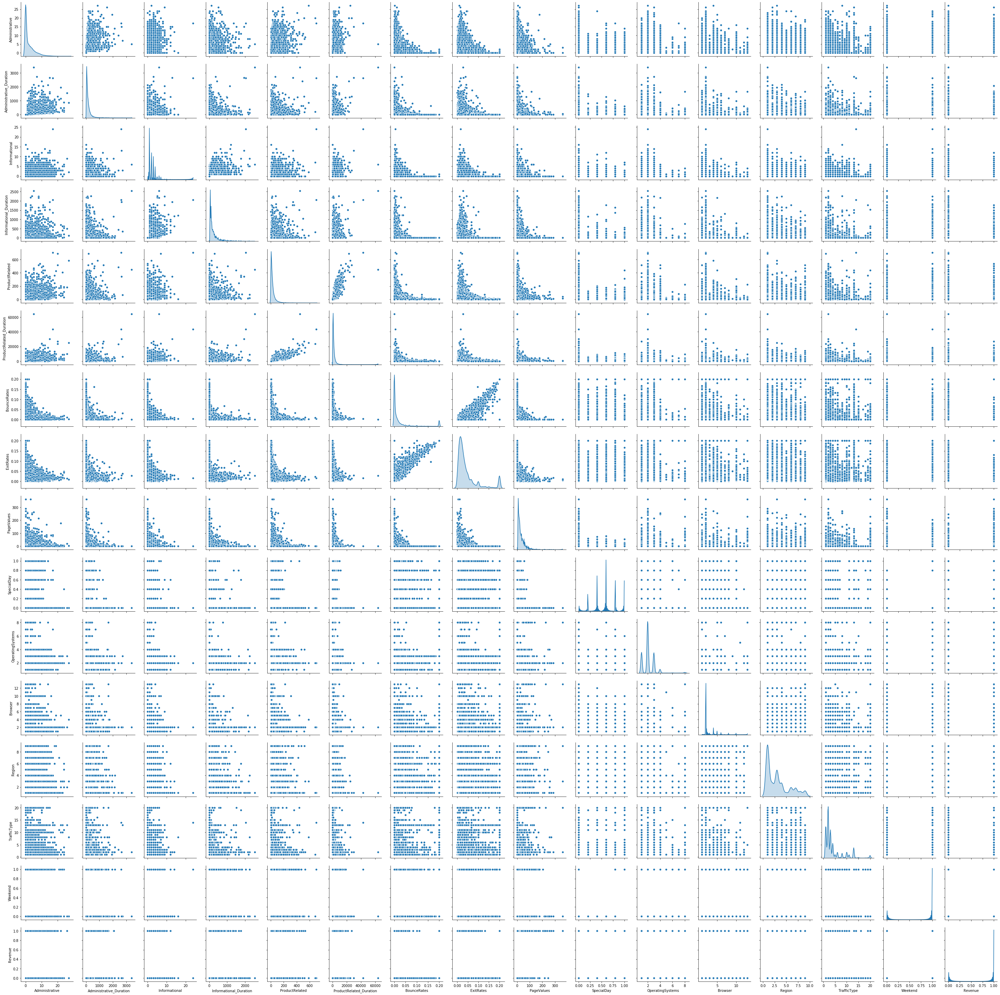

In [18]:
sns.pairplot(df,diag_kind='kde')

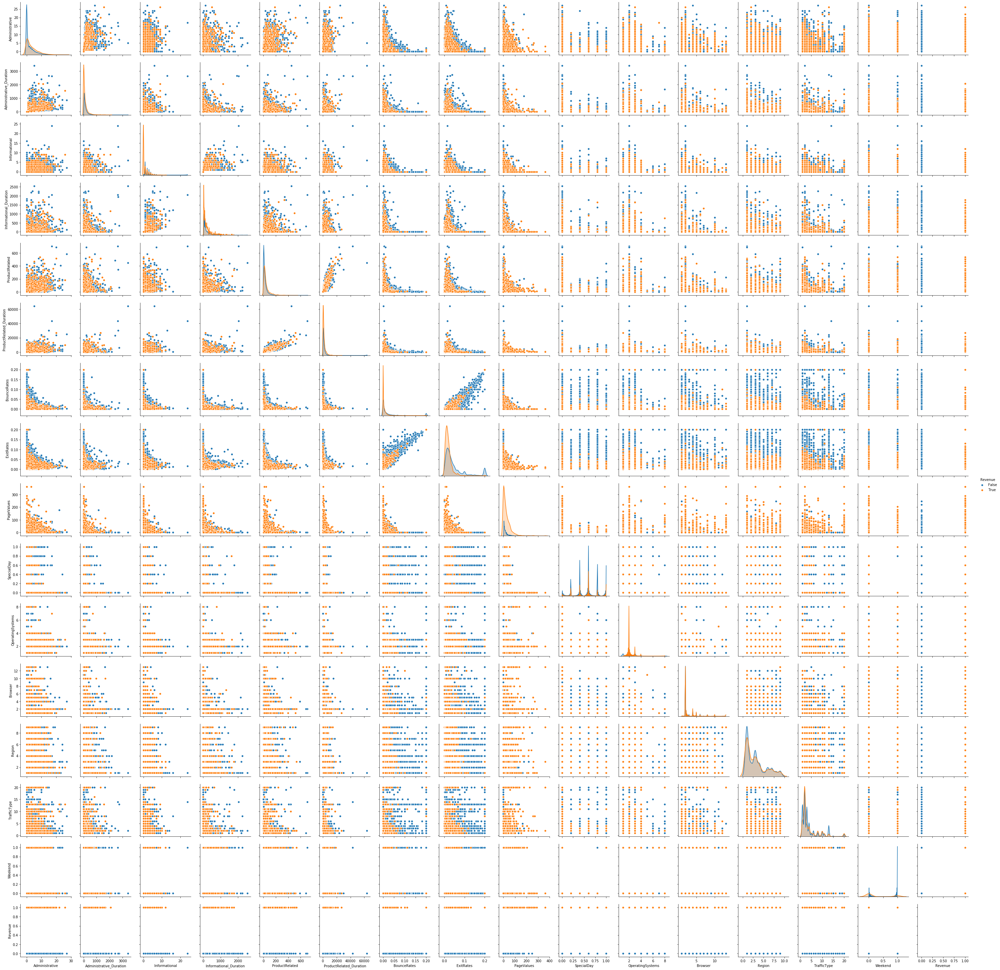

In [19]:
sns.pairplot(df,hue='Revenue')

# Multi-Variate Analysis

In [10]:
from plotly.offline import init_notebook_mode, iplot
from bubbly.bubbly import bubbleplot 

df['Revenue']=df['Revenue'].astype('object')
figure = bubbleplot(dataset=df, x_column='BounceRates', y_column='ExitRates', z_column='ProductRelated', size_column='ProductRelated',color_column='Revenue',  
    bubble_column='Revenue',x_title="BounceRates", y_title="ExitRates",z_title="ProductRelated", title='Bubble Plot', scale_bubble=3, height=650)

iplot(figure, config={'scrollzoom': True})

In [11]:
figure = bubbleplot(dataset=df, x_column='Administrative_Duration', y_column='Informational_Duration', z_column='ProductRelated_Duration',
    bubble_column='ProductRelated', size_column='ProductRelated',color_column='Revenue',  
    x_title="Administrative_Duration", y_title="Informational_Duration",z_title="ProductRelated_Duration", title='Bubble Plot', scale_bubble=3, height=650)

iplot(figure, config={'scrollzoom': True})

# 3.FEATURE ENGINEERING

In [17]:
df['Administrative'].value_counts()

0     5768
1     1354
2     1114
3      915
4      765
5      575
6      432
7      338
8      287
9      225
10     153
11     105
12      86
13      56
14      44
15      38
16      24
17      16
18      12
19       6
24       4
22       4
23       3
20       2
21       2
26       1
27       1
Name: Administrative, dtype: int64

In [5]:
df2=df.copy()

In [19]:
#s = df2['Administrative'].value_counts()
#df2['Administrative'] = np.where(df2['Administrative'].isin(s.index[s > 1000 ]), '0', df2['Administrative'])
#df2['Administrative'] = np.where(df2['Administrative'].isin(s.index[(s >= 500) & (s<1000)]), '1', df2['Administrative'])
#df2['Administrative'] = np.where(df2['Administrative'].isin(s.index[(s>=100) & (s<500)]), '2', df2['Administrative'])
#df2['Administrative'] = np.where(df2['Administrative'].isin(s.index[s < 100]), '3', df2['Administrative'])

In [20]:
#df2['Administrative'].value_counts()

In [21]:
df['ProductRelated'].value_counts()

1      622
2      465
3      458
4      404
6      396
7      391
5      382
8      370
10     330
9      317
12     313
11     308
13     289
15     270
16     260
14     251
17     226
20     225
19     218
22     213
18     200
21     199
24     192
23     180
27     177
26     155
25     154
28     144
30     142
29     135
31     128
33     121
32     119
37     118
36     110
39     109
34     103
35     101
38      89
41      85
42      77
43      73
45      71
40      71
44      69
46      68
50      64
48      62
53      60
49      60
47      56
51      52
52      50
59      48
57      47
62      46
54      46
55      45
56      44
60      42
58      41
61      40
63      39
0       38
66      38
81      37
64      36
65      33
71      33
68      32
79      31
67      30
69      30
70      29
85      28
72      27
74      25
80      25
77      24
73      24
82      23
89      22
83      21
84      20
93      20
98      19
95      19
91      18
76      18
94      18
75      17

In [22]:
#p = df2['ProductRelated'].value_counts()
#df2['ProductRelated'] = np.where(df2['ProductRelated'].isin(p.index[p > 500 ]), '0', df2['ProductRelated'])
#df2['ProductRelated'] = np.where(df2['ProductRelated'].isin(p.index[(p < 500) & (p>=100)]), '1', df2['ProductRelated'])
#df2['ProductRelated'] = np.where(df2['ProductRelated'].isin(p.index[p < 100]), '2', df2['ProductRelated'])

In [23]:
#df2['ProductRelated'].value_counts()

In [24]:
df['Informational'].value_counts()

0     9699
1     1041
2      728
3      380
4      222
5       99
6       78
7       36
9       15
8       14
10       7
12       5
14       2
11       1
13       1
24       1
16       1
Name: Informational, dtype: int64

In [25]:
#i = df2['Informational'].value_counts()
#df2['Informational'] = np.where(df2['Informational'].isin(i.index[i > 1000 ]), '0', df2['Informational'])
#df2['Informational'] = np.where(df2['Informational'].isin(i.index[(i < 1000) & (i>=100)]), '1', df2['Informational'])
#df2['Informational'] = np.where(df2['Informational'].isin(i.index[i < 100]), '2', df2['Informational'])

In [26]:
#df2['Informational'].value_counts()

In [6]:
df2.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


**Some categorical features have more than 10 sub-categories. Hence, we will retain only those sub-categories with high value counts.**

## TRANSFORMATION OF CATEGORICAL FEATURES

Transformations for categorical features were done by either label encoding or one hot encoding. 

•	**TRAFFICTYPE** column had 20 sub-categories. Top 10 sub-categories having highest counts were considered. 

•	**BROWSER** column had 13 sub-categories. Top 8 sub-categories having highest counts were considered.

•	**MONTH** column had 10 sub-categories. Top 8 sub-categories having highest counts were considered. 

•	**OPERATINGSYSTEM** column had 8 sub-categories. Top 5 sub-categories having highest counts were considered.

•	**VISITORTYPE** column had 3 sub-categories. 3 dummy columns were created.

•	**WEEKEND** and **REVENUE** columns were label encoded as 0 and 1.


#### TRAFFIC TYPE

In [28]:
df['TrafficType'].value_counts()

2     3913
1     2451
3     2052
4     1069
13     738
10     450
6      444
8      343
5      260
11     247
20     198
9       42
7       40
15      38
19      17
14      13
18      10
16       3
12       1
17       1
Name: TrafficType, dtype: int64

**Only the top 10 sub-categories are considered in this feature and those with less value counts are stored in a single sub-category.**

In [7]:
top_10_traffic = [x for x in df2['TrafficType'].value_counts().sort_values(ascending=False).head(10).index]
top_10_traffic

[2, 1, 3, 4, 13, 10, 6, 8, 5, 11]

###### A function is created which takes in the variables and outputs the dummies for the same.

In [8]:
def one_hot_top_x(dataframe,variable,top_x_labels):
    for label in top_x_labels:
        df2[variable+'_'+str(label)] = np.where(df2[variable]==label,1,0)

In [9]:
one_hot_top_x(df2,'TrafficType',top_10_traffic)
df2.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,TrafficType_2,TrafficType_1,TrafficType_3,TrafficType_4,TrafficType_13,TrafficType_10,TrafficType_6,TrafficType_8,TrafficType_5,TrafficType_11
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False,0,1,0,0,0,0,0,0,0,0
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False,1,0,0,0,0,0,0,0,0,0
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False,0,0,1,0,0,0,0,0,0,0
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False,0,0,0,1,0,0,0,0,0,0
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False,0,0,0,1,0,0,0,0,0,0


#### BROWSER

###### Same transformation for BROWSER feature.

In [10]:
top_8_browser = [x for x in df2['Browser'].value_counts().sort_values(ascending=False).head(8).index]
top_8_browser

[2, 1, 4, 5, 6, 10, 8, 3]

In [11]:
one_hot_top_x(df2,'Browser',top_8_browser)
df2.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,TrafficType_2,TrafficType_1,TrafficType_3,TrafficType_4,TrafficType_13,TrafficType_10,TrafficType_6,TrafficType_8,TrafficType_5,TrafficType_11,Browser_2,Browser_1,Browser_4,Browser_5,Browser_6,Browser_10,Browser_8,Browser_3
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1


#### MONTH

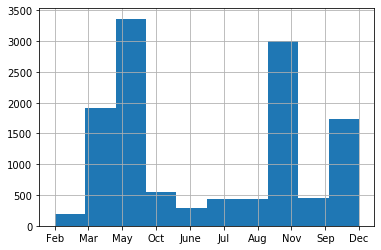

In [34]:
df.Month.hist()

In [12]:
top_8_month = [x for x in df2['Month'].value_counts().sort_values(ascending=False).head(8).index]
top_8_month

['May', 'Nov', 'Mar', 'Dec', 'Oct', 'Sep', 'Aug', 'Jul']

In [13]:
one_hot_top_x(df2,'Month',top_8_month)
df2.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,TrafficType_2,TrafficType_1,TrafficType_3,TrafficType_4,TrafficType_13,TrafficType_10,TrafficType_6,TrafficType_8,TrafficType_5,TrafficType_11,Browser_2,Browser_1,Browser_4,Browser_5,Browser_6,Browser_10,Browser_8,Browser_3,Month_May,Month_Nov,Month_Mar,Month_Dec,Month_Oct,Month_Sep,Month_Aug,Month_Jul
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0


#### OPERATING SYSTEM

In [14]:
top_5_os = [x for x in df2['OperatingSystems'].value_counts().sort_values(ascending=False).head(5).index]
top_5_os

[2, 1, 3, 4, 8]

In [15]:
one_hot_top_x(df2,'OperatingSystems',top_5_os)
df2.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,TrafficType_2,TrafficType_1,TrafficType_3,TrafficType_4,TrafficType_13,TrafficType_10,TrafficType_6,TrafficType_8,TrafficType_5,TrafficType_11,Browser_2,Browser_1,Browser_4,Browser_5,Browser_6,Browser_10,Browser_8,Browser_3,Month_May,Month_Nov,Month_Mar,Month_Dec,Month_Oct,Month_Sep,Month_Aug,Month_Jul,OperatingSystems_2,OperatingSystems_1,OperatingSystems_3,OperatingSystems_4,OperatingSystems_8
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0


#### VISITOR TYPE

In [16]:
labels = [x for x in df2['VisitorType'].value_counts().sort_values(ascending=False).head().index]
labels

['Returning_Visitor', 'New_Visitor', 'Other']

In [17]:
def one_hot_encode(dataframe,variable,labels):
    for label in labels:
        df2[variable+'_'+str(label)] = np.where(df2[variable]==label,1,0)
one_hot_encode(df2,'VisitorType',labels)

In [18]:
df2.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,TrafficType_2,TrafficType_1,TrafficType_3,TrafficType_4,TrafficType_13,TrafficType_10,TrafficType_6,TrafficType_8,TrafficType_5,TrafficType_11,Browser_2,Browser_1,Browser_4,Browser_5,Browser_6,Browser_10,Browser_8,Browser_3,Month_May,Month_Nov,Month_Mar,Month_Dec,Month_Oct,Month_Sep,Month_Aug,Month_Jul,OperatingSystems_2,OperatingSystems_1,OperatingSystems_3,OperatingSystems_4,OperatingSystems_8,VisitorType_Returning_Visitor,VisitorType_New_Visitor,VisitorType_Other
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0


# 4.STATISTICAL TESTS

# Statistical Test for Categorical column vs Target Column

In [42]:
cat_cols=['Administrative','Informational','ProductRelated','Month','OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend', 'SpecialDay']

**Chi-Square test** is conducted as both the columns are categorical and the features have more than 2 sub-categories.

In [43]:
#check weather Revenue is influenced by administrative column 
#H0=proportion of revenue accross all the administrative category is same
#H1=proportion of revenue at least in two administrative category is different
scol=[]
spval=[]
ss=[]
for n in cat_cols:
    scol.append(n)
    cp=chi2_contingency(pd.crosstab(df2[n],df2['Revenue']))[1]
    spval.append(round(cp,4))
    if (cp<0.05):
        #rejects Null
        ss.append('*')
    else:#Accepts Null
        ss.append('**')

In [44]:
pd.DataFrame({'Feature':scol,'P-Value':spval,'Significance':ss})

,Feature,P-Value,Significance
0,Administrative,0.0000,*
1,Informational,0.0000,*
2,ProductRelated,0.0000,*
3,Month,0.0000,*
4,OperatingSystems,0.0000,*
5,Browser,0.0061,*
6,Region,0.3214,**
7,TrafficType,0.0000,*
8,VisitorType,0.0000,*
9,Weekend,0.0013,*


**CONCLUSION:**

Region feature has a p-value greater than 0.05 which indicates that the feature is insignificant. Hence, it will be dropped. 

#### WEEKEND AND REVENUE

Weekend and Revenue columns have been label encoded as they have only 2 sub-categories.

In [19]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

df2['Weekend'] = le.fit_transform(df2['Weekend'])
df2['Revenue'] = le.fit_transform(df2['Revenue'])
df2.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,TrafficType_2,TrafficType_1,TrafficType_3,TrafficType_4,TrafficType_13,TrafficType_10,TrafficType_6,TrafficType_8,TrafficType_5,TrafficType_11,Browser_2,Browser_1,Browser_4,Browser_5,Browser_6,Browser_10,Browser_8,Browser_3,Month_May,Month_Nov,Month_Mar,Month_Dec,Month_Oct,Month_Sep,Month_Aug,Month_Jul,OperatingSystems_2,OperatingSystems_1,OperatingSystems_3,OperatingSystems_4,OperatingSystems_8,VisitorType_Returning_Visitor,VisitorType_New_Visitor,VisitorType_Other
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0


# Statistical Test for Numerical column vs Target Column

In [46]:
numerical_columns=['Administrative_Duration','Informational_Duration','ProductRelated_Duration','BounceRates', 'ExitRates', 'PageValues']

**Flow of statistical tests below:**
   
   a) The features are tested for normality using Shapiro Test.
   
   b) If the feature fails Shapiro test, then Mannwhitneyu test is done to check the statistical significance of the feature with target feature.
    

In [47]:
print('Two-Sample-T-Test of ','\n')
tcol=[]
tpval=[]
ts=[]
for n in numerical_columns:
    print(n,'\n')
    tcol.append(n)
    #splitting into 2 groups(Revenue=True, Revenue=False)
    g1=df2[n][df['Revenue']==False]
    g2=df2[n][df['Revenue']==True]
    #Test for normality(Shapiro Test)
    #H0:Data is normal
    #H0:Data is not normal
    # if p<0.05---reject Null
    for b in [g1]:
        s,p=shapiro(b)
        print('P-value for ',n,'in Group 1(Revenue False):','\n',p)
        if (p<=0.05):
            print('G1 Data is not normal')
        else:
            print('G1 Data is normal')
    for c in [g2]:
        s1,p1=shapiro(c)
        print('P-value for ',n,'in Group 1(Revenue True):','\n',p1)
        if (p1<=0.05):
            print('G2 Data is not normal')
        else:
            print('G2 Data is normal')
    #If data is not normal we do non-parametric Test(Mann Whitney U Test)
    if (p<=0.05 or p1<=0.05):
        ms,mp=mannwhitneyu(g1,g2)
        print('Mannwhitneyu P-Value: ',mp,'\n')
        tpval.append(round(mp,4))
        if (mp<0.05):
            ts.append('*')
        else:
            ts.append('**')

Two-Sample-T-Test of  

Administrative_Duration 

P-value for  Administrative_Duration in Group 1(Revenue False): 
 0.0
G1 Data is not normal
P-value for  Administrative_Duration in Group 1(Revenue True): 
 0.0
G2 Data is not normal
Mannwhitneyu P-Value:  2.3361304523849337e-74 

Informational_Duration 

P-value for  Informational_Duration in Group 1(Revenue False): 
 0.0
G1 Data is not normal
P-value for  Informational_Duration in Group 1(Revenue True): 
 0.0
G2 Data is not normal
Mannwhitneyu P-Value:  7.045192525530919e-36 

ProductRelated_Duration 

P-value for  ProductRelated_Duration in Group 1(Revenue False): 
 0.0
G1 Data is not normal
P-value for  ProductRelated_Duration in Group 1(Revenue True): 
 0.0
G2 Data is not normal
Mannwhitneyu P-Value:  2.6661341820823105e-128 

BounceRates 

P-value for  BounceRates in Group 1(Revenue False): 
 0.0
G1 Data is not normal
P-value for  BounceRates in Group 1(Revenue True): 
 0.0
G2 Data is not normal
Mannwhitneyu P-Value:  9.1638502955

In [48]:
pd.DataFrame({'Feature':tcol,'P-Value':tpval,'Significant':ts})

,Feature,P-Value,Significant
0,Administrative_Duration,0.0,*
1,Informational_Duration,0.0,*
2,ProductRelated_Duration,0.0,*
3,BounceRates,0.0,*
4,ExitRates,0.0,*
5,PageValues,0.0,*


**CONCLUSION:**

All the numerical features are statistically significant for model building.

# Outliers

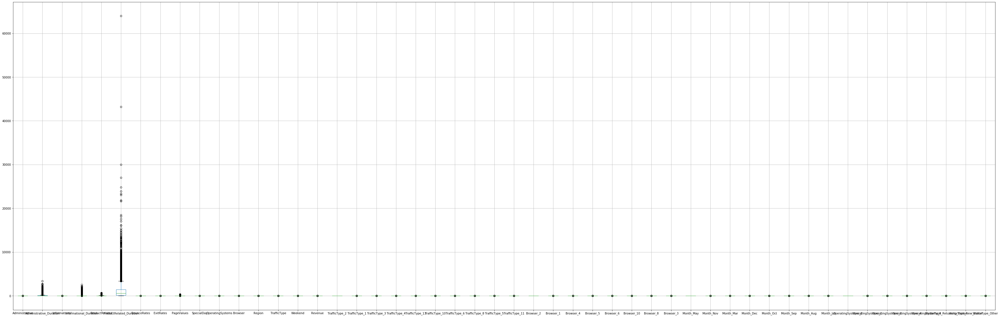

In [49]:
plt.figure(figsize=(62,20))
df2.boxplot()

In [43]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 52 columns):
Administrative                   12330 non-null int64
Administrative_Duration          12330 non-null float64
Informational                    12330 non-null int64
Informational_Duration           12330 non-null float64
ProductRelated                   12330 non-null int64
ProductRelated_Duration          12330 non-null float64
BounceRates                      12330 non-null float64
ExitRates                        12330 non-null float64
PageValues                       12330 non-null float64
SpecialDay                       12330 non-null float64
Month                            12330 non-null object
OperatingSystems                 12330 non-null int64
Browser                          12330 non-null int64
Region                           12330 non-null int64
TrafficType                      12330 non-null int64
VisitorType                      12330 non-null object
Weekend    

In [50]:
num_col=['Administrative_Duration',
       'Informational_Duration', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues']

In [44]:
# identify outliers with standard deviation
from numpy.random import seed
from numpy.random import randn
from numpy import mean
from numpy import std
out_per=[]
for i in num_col:
    data_mean, data_std = mean(df2[i]), std(df2[i])
# identify outliers
    cut_off = data_std * 3
    lower, upper = data_mean - cut_off, data_mean + cut_off
    print(i,': \n')
# identify outliers
    outliers = [x for x in df2[i] if x < lower or x > upper]
    
    num_out=len(outliers)
    print('Identified outliers: %d' % num_out)
    outliers_removed = [x for x in df2[i] if x >= lower and x <= upper]
    num_nout=len(outliers_removed)
    print('Non-outlier observations: %d' % num_nout)
    outlier_percent=(num_out/(num_out+num_nout))*100
    print('percent of outlers:',outlier_percent ,'\n')
    out_per.append(outlier_percent)

Administrative_Duration : 

Identified outliers: 232
Non-outlier observations: 12098
percent of outlers: 1.8815896188158963 

Informational_Duration : 

Identified outliers: 230
Non-outlier observations: 12100
percent of outlers: 1.8653690186536902 

ProductRelated_Duration : 

Identified outliers: 219
Non-outlier observations: 12111
percent of outlers: 1.7761557177615572 

BounceRates : 

Identified outliers: 708
Non-outlier observations: 11622
percent of outlers: 5.742092457420925 

ExitRates : 

Identified outliers: 713
Non-outlier observations: 11617
percent of outlers: 5.78264395782644 

PageValues : 

Identified outliers: 259
Non-outlier observations: 12071
percent of outlers: 2.1005677210056772 



# Visualization of Outliers

In [48]:
Outliers=pd.DataFrame({'Feature':num_col,'% Of Outliers':out_per})
outlier_sorted=Outliers.sort_values('% Of Outliers',ascending=False)
outlier_sorted

,Feature,% Of Outliers
4,ExitRates,5.782644
3,BounceRates,5.742092
5,PageValues,2.100568
0,Administrative_Duration,1.881590
1,Informational_Duration,1.865369
2,ProductRelated_Duration,1.776156


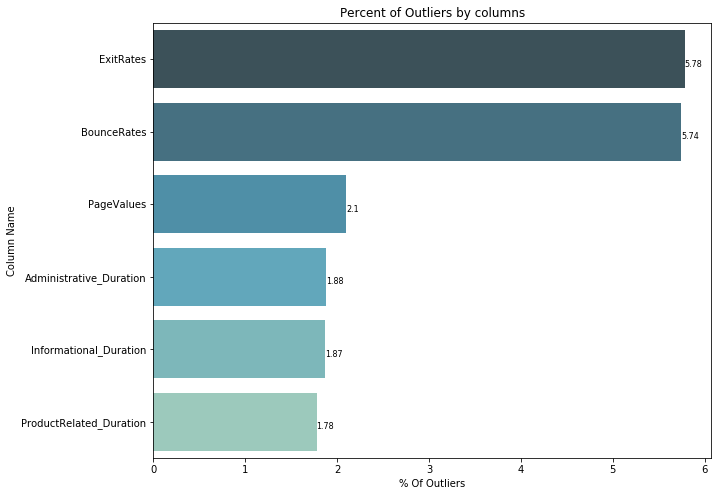

In [49]:
plt.figure(figsize=(10,8))
sns.barplot(y=outlier_sorted['Feature'],x=outlier_sorted['% Of Outliers'],palette='GnBu_d')
plt.title('Percent of Outliers by columns')
plt.ylabel('Column Name')
for i, v in enumerate(list(outlier_sorted['% Of Outliers'])):
    plt.text(v,i-(-0.1),round(list(outlier_sorted['% Of Outliers'])[i],2),fontsize=8)
    
    plt.savefig('Outliers.jpeg',bbox_inches='tight',dpi=150)

# Transformation of numerical features

**Following transformations will be applied and the best out of the lot will be selected:**

1)Log transformation

2)Reciprocal transformation

3)Square root and Cube root transformation

4)Exponential transformation

5)Boxcox transformation

ADMINISTRATIVE_DURATION 

        Transformation      Skew
                Actual  5.615719
                   Log  0.255290
            Reciprocal  0.075927
 Exponential power 0.2  0.226312
 Exponential power 0.3  0.568386
           Square Root  1.540063
             Cube Root  0.704611
                Boxcox  0.145485

 Best Transformation for  Administrative_Duration : 
 Reciprocal = 0.07592740350881566


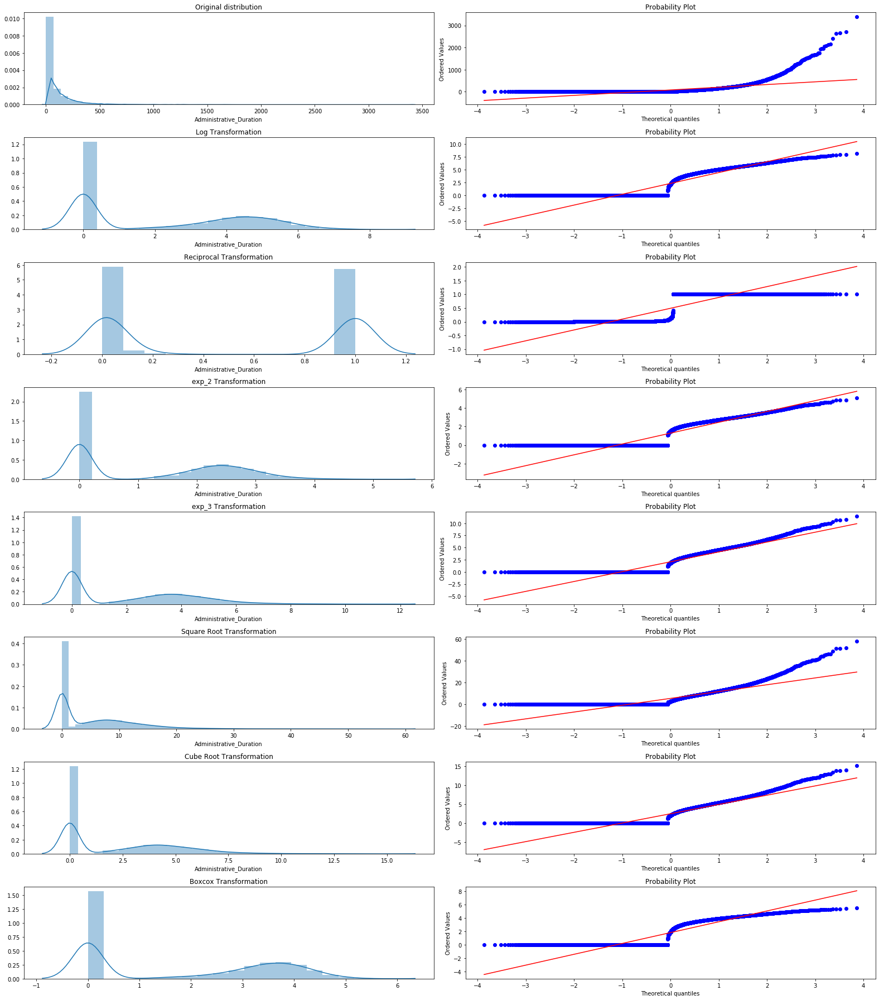

INFORMATIONAL_DURATION 

        Transformation      Skew
                Actual  7.579185
                   Log  1.918710
            Reciprocal -1.549764
 Exponential power 0.2  1.883958
 Exponential power 0.3  2.285333
           Square Root  3.439995
             Cube Root  2.447755
                Boxcox  1.546903

 Best Transformation for  Informational_Duration : 
 Boxcox = 1.5469030402129191


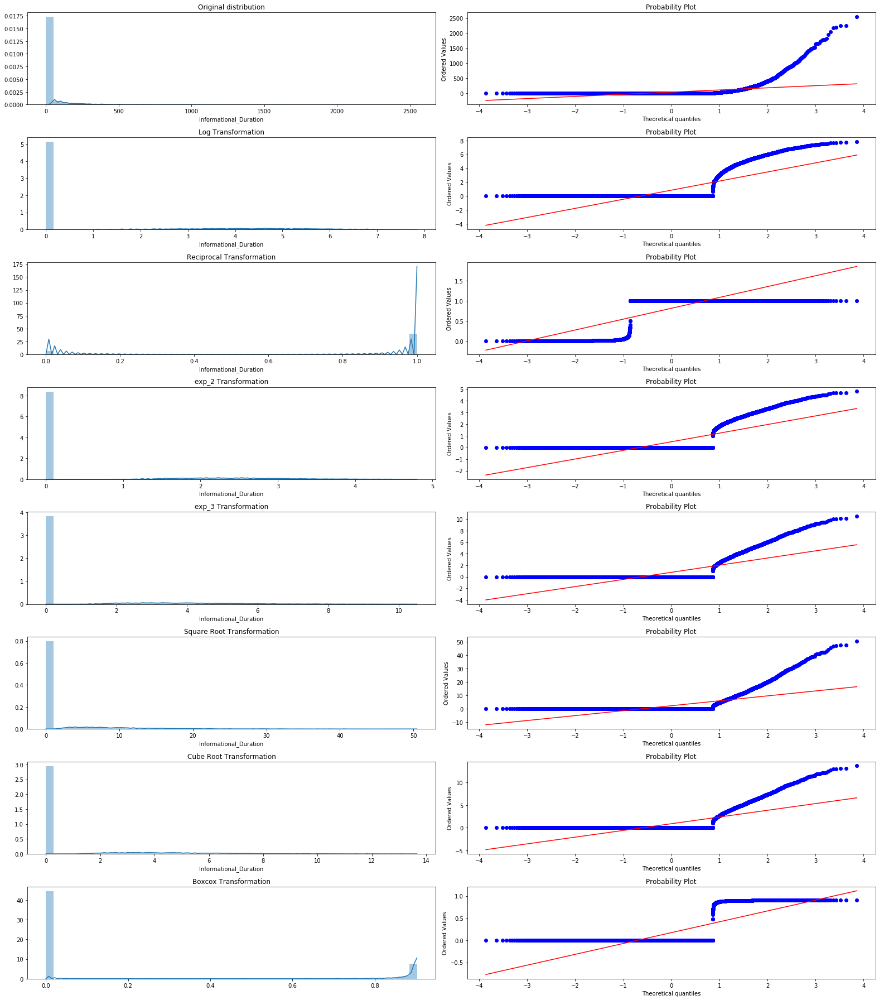

PRODUCTRELATED_DURATION 

        Transformation      Skew
                Actual  7.263228
                   Log -1.421052
            Reciprocal  3.632101
 Exponential power 0.2 -0.764205
 Exponential power 0.3  0.152610
           Square Root  1.393891
             Cube Root  0.384956
                Boxcox -0.036336

 Best Transformation for  ProductRelated_Duration : 
 Boxcox = -0.03633623414663033


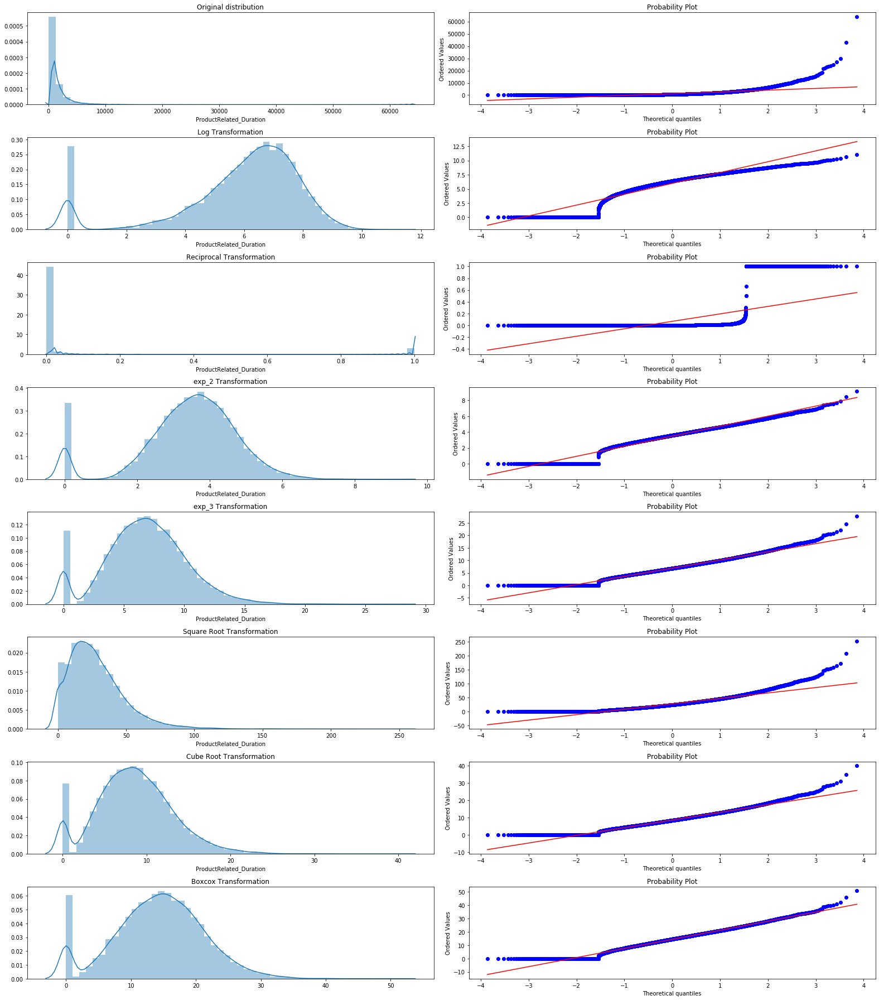

BOUNCERATES 

        Transformation      Skew
                Actual  2.947855
                   Log  2.877552
            Reciprocal -2.805275
 Exponential power 0.2  0.261255
 Exponential power 0.3  0.736061
           Square Root  1.681473
             Cube Root  0.903582
                Boxcox  1.032599

 Best Transformation for  BounceRates : 
 Exponential power 0.2 = 0.26125456824641907


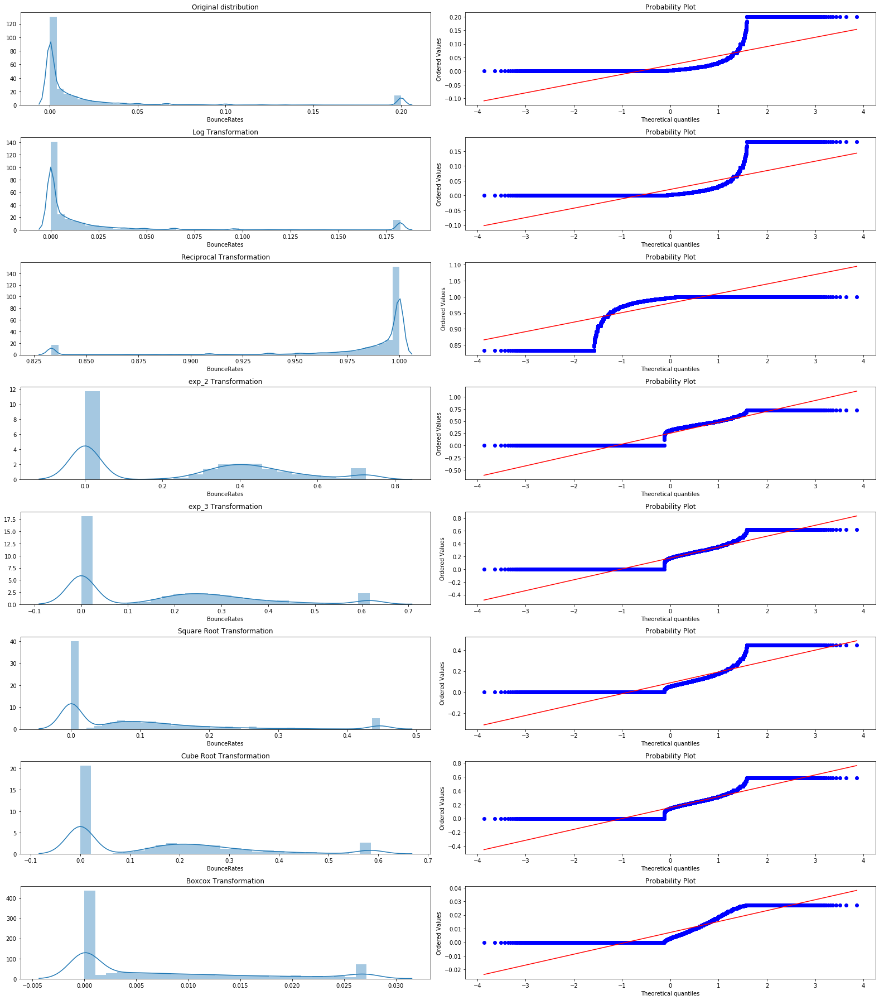

EXITRATES 

        Transformation      Skew
                Actual  2.148789
                   Log  2.055103
            Reciprocal -1.961089
 Exponential power 0.2 -0.114265
 Exponential power 0.3  0.567938
           Square Root  1.208090
             Cube Root  0.706804
                Boxcox  0.433598

 Best Transformation for  ExitRates : 
 Exponential power 0.2 = -0.11426457470004021


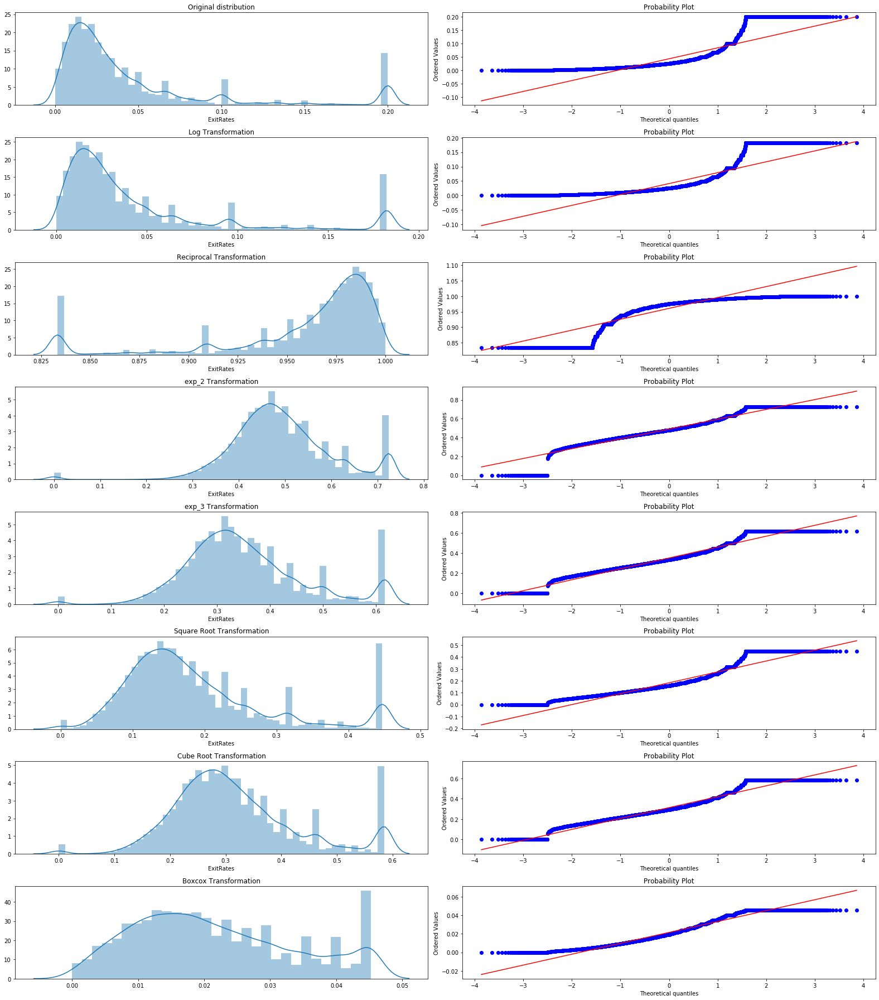

PAGEVALUES 

        Transformation      Skew
                Actual  6.382964
                   Log  1.805933
            Reciprocal -1.406461
 Exponential power 0.2  1.560948
 Exponential power 0.3  1.804042
           Square Root  2.533834
             Cube Root  1.902707
                Boxcox  1.377420

 Best Transformation for  PageValues : 
 Boxcox = 1.3774203430455354


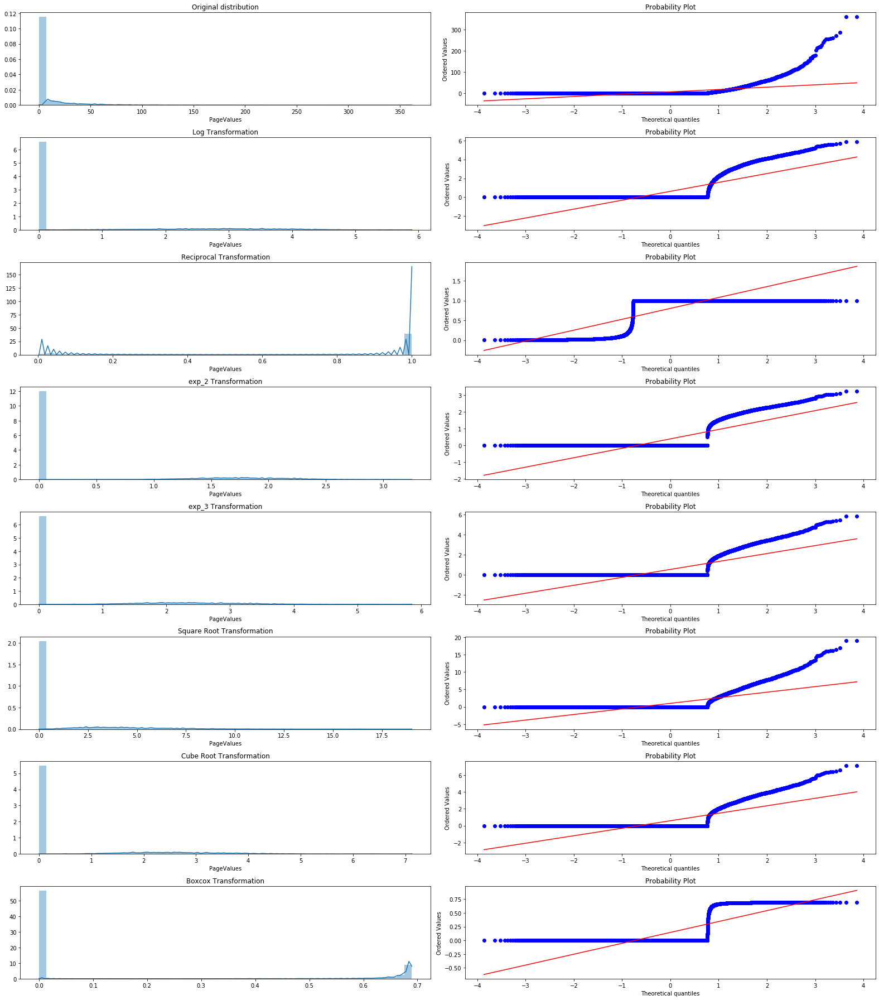

In [63]:
for column in ['Administrative_Duration','Informational_Duration','ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues']:
    
    print('\033[1m'+column.upper()+'\033[0m','\n')
    plt.figure(figsize=(22,25))
    
    raw_skewness = df2[column].skew()
    
    plt.subplot(8,2,1)
    sns.distplot(df2[column])
    plt.title('Original distribution')
    
    plt.subplot(8,2,2)
    st.probplot(df2[column],dist='norm',plot=plt)
    
    
    #log transformation
    log_transform = np.log(df2[column]+1)
    log_skew=log_transform.skew()
    
    plt.subplot(8,2,3)
    sns.distplot(log_transform)
    plt.title('Log Transformation')
    
    plt.subplot(8,2,4)
    st.probplot(log_transform,dist='norm',plot=plt)
    
    #Reciprocal Transformation  
    
    recip_transform = 1/(df2[column]+1)
    recip_skew=recip_transform.skew()
    
    plt.subplot(8,2,5)
    sns.distplot(recip_transform)
    plt.title('Reciprocal Transformation')
    
    plt.subplot(8,2,6)
    st.probplot(recip_transform,dist='norm',plot=plt)
    
    #Exponential Transformation
    
    exp_2 = df2[column]**0.2
    exp_2_skew=exp_2.skew()
    
    plt.subplot(8,2,7)
    sns.distplot(exp_2)
    plt.title('exp_2 Transformation')
    
    plt.subplot(8,2,8)
    st.probplot(exp_2,dist='norm',plot=plt)
    
    exp_3 = df2[column]**0.3
    exp_3_skew=exp_3.skew()
    
    plt.subplot(8,2,9)
    sns.distplot(exp_3)
    plt.title('exp_3 Transformation')
    
    plt.subplot(8,2,10)
    st.probplot(exp_3,dist='norm',plot=plt)
    
    #Square Root Transformation
    
    sqrt_transform = df2[column]**(1/2)
    sqrt_transform_skew=sqrt_transform.skew()
    
    plt.subplot(8,2,11)
    sns.distplot(sqrt_transform)
    plt.title('Square Root Transformation')
    
    plt.subplot(8,2,12)
    st.probplot(sqrt_transform,dist='norm',plot=plt)
    
    #Cube Root Transformation
    
    cube_transform = df2[column]**(1/3)
    cube_transform_skew=cube_transform.skew()
    
    plt.subplot(8,2,13)
    sns.distplot(cube_transform)
    plt.title('Cube Root Transformation')
    
    plt.subplot(8,2,14)
    st.probplot(cube_transform,dist='norm',plot=plt)
    
    #Boxcox Transformation
    
    box,param = st.boxcox(df2[column]+1)
    boxcox_skew=pd.DataFrame(box).skew()
    
    plt.subplot(8,2,15)
    plt.tight_layout()
    sns.distplot(pd.DataFrame(box))
    plt.title('Boxcox Transformation')
    
    plt.subplot(8,2,16)
    st.probplot(box,dist='norm',plot=plt)
    
    trans_result= {'Actual':raw_skewness, 'Log':log_skew,'Reciprocal':recip_skew,'Exponential power 0.2':exp_2_skew,
                       'Exponential power 0.3':exp_3_skew,'Square Root':sqrt_transform_skew,
                       'Cube Root':cube_transform_skew,'Boxcox':boxcox_skew[0]}
    print(pd.DataFrame(trans_result.items(), columns=['Transformation', 'Skew']).to_string(index=False))
    
    lst=list(trans_result.values())
    idx = min((abs(x), x) for x in lst)[1]
    for i in trans_result:
        if (trans_result[i]==idx):
            print('\n','Best Transformation for ',column,':','\n',i,'=',trans_result[i])
    plt.tight_layout() 
    
    plt.show()

In [20]:
df_copy=df2.copy()
df_copy.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,TrafficType_2,TrafficType_1,TrafficType_3,TrafficType_4,TrafficType_13,TrafficType_10,TrafficType_6,TrafficType_8,TrafficType_5,TrafficType_11,Browser_2,Browser_1,Browser_4,Browser_5,Browser_6,Browser_10,Browser_8,Browser_3,Month_May,Month_Nov,Month_Mar,Month_Dec,Month_Oct,Month_Sep,Month_Aug,Month_Jul,OperatingSystems_2,OperatingSystems_1,OperatingSystems_3,OperatingSystems_4,OperatingSystems_8,VisitorType_Returning_Visitor,VisitorType_New_Visitor,VisitorType_Other
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0


# Transforming Data

#### Distribution Before Transformation

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001DC32333D48>,
      dtype=object)

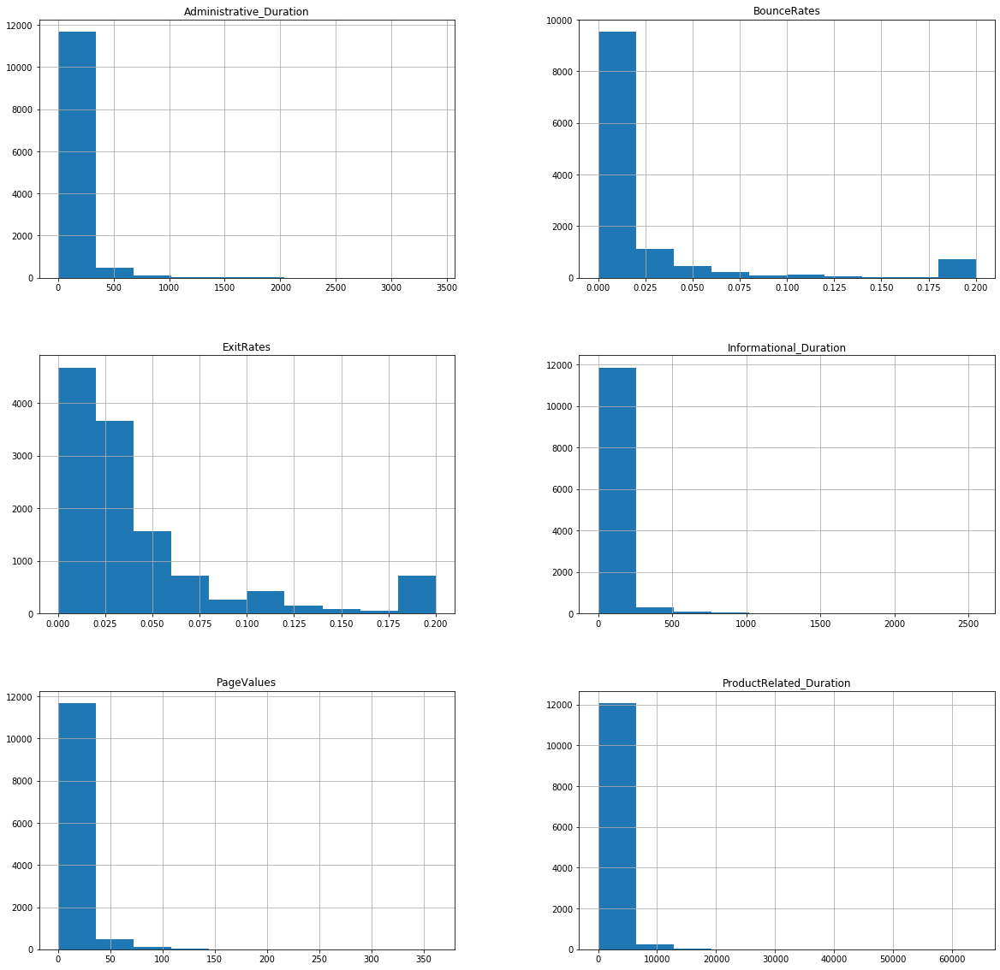

In [52]:
df_copy.hist(column=num_col,figsize=(20,20))

#### Transforming the columns with the best transformation technique

In [21]:
df_copy['Administrative_Duration']=1/(df['Administrative_Duration']+1)
df_copy['Informational_Duration'],i = st.boxcox(df['Informational_Duration']+1)
df_copy['ProductRelated_Duration'],pd = st.boxcox(df['ProductRelated_Duration']+1)
df_copy['BounceRates']= df['BounceRates']**0.2 
df_copy['ExitRates']=df['ExitRates']**0.2 
df_copy['PageValues'],p = st.boxcox(df['PageValues']+1)

#### Distribution After transformation

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000001DC331E3D88>,
      dtype=object)

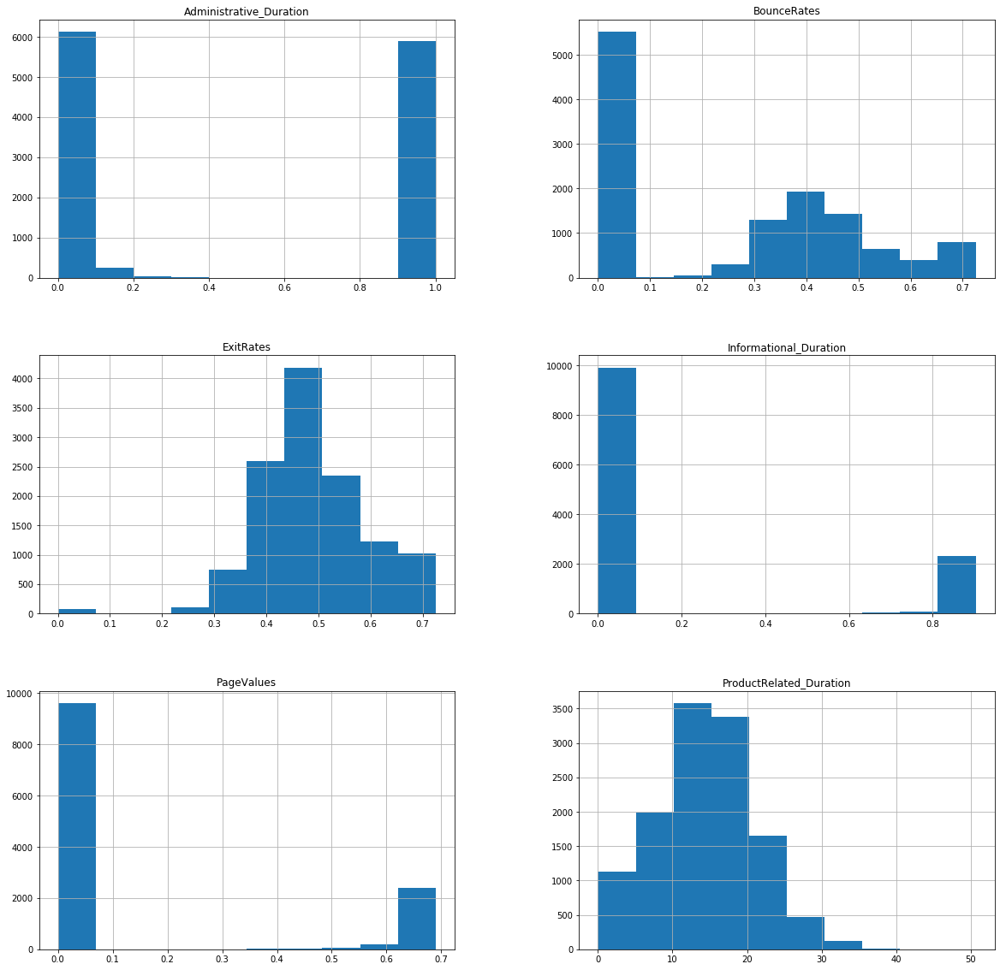

In [54]:
df_copy.hist(column=num_col,figsize=(20,20))

**CONCLUSION:**
    
From the above plots, most of the features were brought to normal distribution.

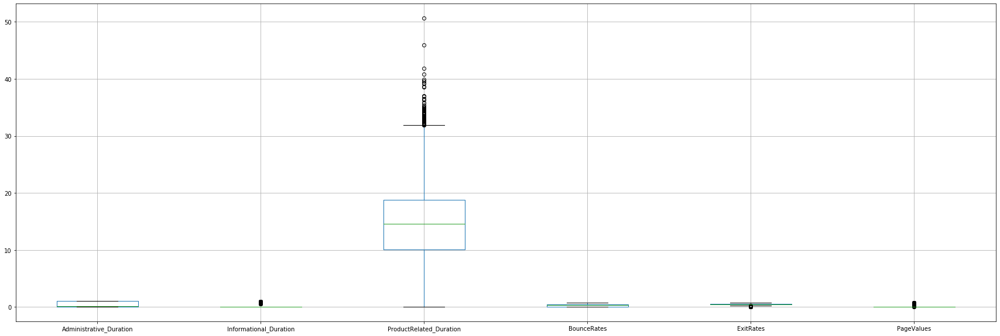

In [55]:
plt.figure(figsize=(30,10))
df_copy.boxplot(column=num_col)

In [22]:
df_copy.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,TrafficType_2,TrafficType_1,TrafficType_3,TrafficType_4,TrafficType_13,TrafficType_10,TrafficType_6,TrafficType_8,TrafficType_5,TrafficType_11,Browser_2,Browser_1,Browser_4,Browser_5,Browser_6,Browser_10,Browser_8,Browser_3,Month_May,Month_Nov,Month_Mar,Month_Dec,Month_Oct,Month_Sep,Month_Aug,Month_Jul,OperatingSystems_2,OperatingSystems_1,OperatingSystems_3,OperatingSystems_4,OperatingSystems_8,VisitorType_Returning_Visitor,VisitorType_New_Visitor,VisitorType_Other
0,0,1.0,0,0.0,1,0.000000,0.724780,0.724780,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
1,0,1.0,0,0.0,2,6.990788,0.000000,0.630957,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
2,0,1.0,0,0.0,1,0.000000,0.724780,0.724780,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
3,0,1.0,0,0.0,2,1.513204,0.549280,0.674879,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
4,0,1.0,0,0.0,10,14.727490,0.457305,0.549280,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0


# Multicollinearity

**Multicollinearity** refers to a situation in which two or more explanatory variables in a multiple regression model are highly linearly related. It can decrease the performance of the model. Hence, there is a need to remove features that are correlated with each other.

In [23]:
df_vif=df_copy[['Administrative_Duration','Informational_Duration','ProductRelated_Duration','BounceRates','ExitRates','PageValues']]

In [24]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [25]:
X = df_vif

In [26]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative_Duration  12330 non-null  float64
 1   Informational_Duration   12330 non-null  float64
 2   ProductRelated_Duration  12330 non-null  float64
 3   BounceRates              12330 non-null  float64
 4   ExitRates                12330 non-null  float64
 5   PageValues               12330 non-null  float64
dtypes: float64(6)
memory usage: 578.1 KB


In [126]:
calc_vif(X)

AttributeError: 'numpy.float64' object has no attribute 'DataFrame'

In [128]:
(np.corrcoef(df['BounceRates'],df['ExitRates']))**2

array([[1.        , 0.83357703],
       [0.83357703, 1.        ]])

**CONCLUSION**

**Exit Rates** feature has a high VIF value and the **correlation coefficient** is also very high. Hence, it will be dropped for model building.

In [28]:
df_copy.shape

(12330, 52)

In [29]:
df_copy.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue,TrafficType_2,TrafficType_1,TrafficType_3,TrafficType_4,TrafficType_13,TrafficType_10,TrafficType_6,TrafficType_8,TrafficType_5,TrafficType_11,Browser_2,Browser_1,Browser_4,Browser_5,Browser_6,Browser_10,Browser_8,Browser_3,Month_May,Month_Nov,Month_Mar,Month_Dec,Month_Oct,Month_Sep,Month_Aug,Month_Jul,OperatingSystems_2,OperatingSystems_1,OperatingSystems_3,OperatingSystems_4,OperatingSystems_8,VisitorType_Returning_Visitor,VisitorType_New_Visitor,VisitorType_Other
0,0,1.0,0,0.0,1,0.000000,0.724780,0.724780,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
1,0,1.0,0,0.0,2,6.990788,0.000000,0.630957,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
2,0,1.0,0,0.0,1,0.000000,0.724780,0.724780,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
3,0,1.0,0,0.0,2,1.513204,0.549280,0.674879,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
4,0,1.0,0,0.0,10,14.727490,0.457305,0.549280,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0


In [30]:
df_final = df_copy.drop(['Month','OperatingSystems','Browser','TrafficType'],axis=1)
df_final.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Region,VisitorType,Weekend,Revenue,TrafficType_2,TrafficType_1,TrafficType_3,TrafficType_4,TrafficType_13,TrafficType_10,TrafficType_6,TrafficType_8,TrafficType_5,TrafficType_11,Browser_2,Browser_1,Browser_4,Browser_5,Browser_6,Browser_10,Browser_8,Browser_3,Month_May,Month_Nov,Month_Mar,Month_Dec,Month_Oct,Month_Sep,Month_Aug,Month_Jul,OperatingSystems_2,OperatingSystems_1,OperatingSystems_3,OperatingSystems_4,OperatingSystems_8,VisitorType_Returning_Visitor,VisitorType_New_Visitor,VisitorType_Other
0,0,1.0,0,0.0,1,0.000000,0.724780,0.724780,0.0,0.0,1,Returning_Visitor,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
1,0,1.0,0,0.0,2,6.990788,0.000000,0.630957,0.0,0.0,1,Returning_Visitor,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
2,0,1.0,0,0.0,1,0.000000,0.724780,0.724780,0.0,0.0,9,Returning_Visitor,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
3,0,1.0,0,0.0,2,1.513204,0.549280,0.674879,0.0,0.0,2,Returning_Visitor,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
4,0,1.0,0,0.0,10,14.727490,0.457305,0.549280,0.0,0.0,1,Returning_Visitor,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0


In [31]:
df_final.drop('VisitorType',axis=1,inplace=True)

In [32]:
df_final.drop('Region',axis=1,inplace=True)

In [33]:
df_final.shape

(12330, 46)

In [34]:
df_final.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Weekend,Revenue,TrafficType_2,TrafficType_1,TrafficType_3,TrafficType_4,TrafficType_13,TrafficType_10,TrafficType_6,TrafficType_8,TrafficType_5,TrafficType_11,Browser_2,Browser_1,Browser_4,Browser_5,Browser_6,Browser_10,Browser_8,Browser_3,Month_May,Month_Nov,Month_Mar,Month_Dec,Month_Oct,Month_Sep,Month_Aug,Month_Jul,OperatingSystems_2,OperatingSystems_1,OperatingSystems_3,OperatingSystems_4,OperatingSystems_8,VisitorType_Returning_Visitor,VisitorType_New_Visitor,VisitorType_Other
0,0,1.0,0,0.0,1,0.000000,0.724780,0.724780,0.0,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
1,0,1.0,0,0.0,2,6.990788,0.000000,0.630957,0.0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
2,0,1.0,0,0.0,1,0.000000,0.724780,0.724780,0.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
3,0,1.0,0,0.0,2,1.513204,0.549280,0.674879,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
4,0,1.0,0,0.0,10,14.727490,0.457305,0.549280,0.0,0.0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0


# 5.PCA

In [95]:
X=df_final.drop(columns=['Revenue'],axis=1)
y=df_final['Revenue']

The data is brought under the same scale by using Sklearn's **Standard Scaler** feature.

In [96]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
Xs_pca=ss.fit_transform(X)

In [97]:
from sklearn.decomposition import PCA
pca = PCA()
X_pca = pca.fit_transform(Xs_pca)

In [74]:
# Weights or Loadings of Principal Components

In [75]:
# Principal Components Weights (Eigenvectors)
df_pca_loadings = pd.DataFrame(pca.components_)
df_pca_loadings.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44
0,0.345557,-0.343096,0.282005,0.293526,0.318837,0.368365,-0.172632,-0.337968,0.252936,-0.105377,0.034223,0.185980,-0.071338,-0.118538,-0.007954,-0.058483,0.005041,-0.013199,0.028998,0.027522,-0.016663,0.080806,-0.079853,0.005297,-0.000241,-0.008638,0.007533,-0.036862,-0.031282,-0.095194,0.094512,-0.043175,0.008253,0.051445,0.040725,0.026462,-0.000928,0.109393,-0.079883,-0.049042,-0.004265,-0.013666,-0.093282,0.099680,-0.018595
1,-0.006105,-0.055645,-0.062573,-0.060536,-0.128345,-0.090894,-0.186803,-0.138549,-0.009019,-0.117234,0.067382,0.136912,-0.119063,0.021512,-0.033943,-0.173915,0.010770,-0.060622,0.102276,0.081958,0.005239,-0.376367,0.419756,0.007267,-0.003073,-0.017400,-0.001737,0.075351,0.004962,-0.121862,0.019844,0.015690,0.080857,0.054270,0.017768,0.006650,-0.016098,-0.250074,0.409916,-0.158569,0.082213,0.076695,-0.308099,0.295837,0.077523
2,0.132184,-0.040711,0.218846,0.207941,0.189871,0.142625,0.266639,0.125566,0.067342,0.058741,0.036655,-0.102364,0.049865,0.111112,0.041984,0.020416,0.034224,-0.014759,-0.082818,-0.099698,-0.012808,-0.221098,0.334119,-0.081545,-0.031629,-0.000681,-0.018875,0.052892,0.005385,0.056558,0.052795,-0.048065,-0.083494,-0.013958,-0.042916,0.003729,0.022976,-0.285176,0.322160,0.012575,0.067241,-0.091430,0.391264,-0.375246,-0.100310
3,0.011581,0.007090,0.063159,0.043869,-0.007853,-0.049295,0.143798,0.101619,-0.077787,-0.267263,0.081055,0.053228,0.046939,-0.106651,-0.242210,0.131395,0.124484,-0.086895,0.092371,-0.065981,0.065627,0.237815,-0.049558,-0.238762,-0.161355,-0.094954,-0.108675,0.007882,0.078389,-0.394303,0.237168,0.069638,0.180947,-0.022821,-0.010778,-0.026107,0.005731,-0.328936,-0.018447,0.402063,-0.019752,0.157842,-0.047110,0.009166,0.161923
4,0.074979,-0.106604,0.047656,0.056968,-0.059224,-0.047767,0.026842,-0.032755,0.008613,0.290355,0.089617,-0.036945,-0.312386,0.011299,0.248942,0.181042,-0.110841,0.082369,0.003720,0.132438,0.074709,0.162958,0.002353,-0.186549,-0.134517,-0.078044,-0.069266,0.016290,0.104281,0.389682,-0.130409,-0.254215,-0.114127,0.026940,0.040228,0.012579,0.003517,-0.295948,0.018212,0.350822,0.002112,-0.034662,-0.189705,0.203064,-0.039262


In [76]:
pca.explained_variance_ratio_

array([8.81288529e-02, 6.72609832e-02, 5.85923116e-02, 4.44538335e-02,
       4.28332259e-02, 3.82635160e-02, 3.25910352e-02, 2.98513779e-02,
       2.92154690e-02, 2.83940403e-02, 2.79575215e-02, 2.56817207e-02,
       2.52466588e-02, 2.49555508e-02, 2.42306055e-02, 2.38893107e-02,
       2.34276162e-02, 2.33546738e-02, 2.30262912e-02, 2.26425178e-02,
       2.25170154e-02, 2.22046070e-02, 2.19677138e-02, 2.13714231e-02,
       2.08358362e-02, 2.04998524e-02, 1.88548733e-02, 1.82036487e-02,
       1.77320362e-02, 1.67749703e-02, 1.65473216e-02, 1.57471801e-02,
       1.52082012e-02, 1.13905695e-02, 8.02339566e-03, 7.68252211e-03,
       5.74869714e-03, 4.85913111e-03, 4.48035035e-03, 3.24487683e-03,
       1.02246015e-03, 7.15063949e-04, 2.81305969e-04, 8.98353922e-05,
       1.73803517e-32])

In [77]:
X=Xs_pca.astype(float)
cov_matrix = np.cov(X.T)
print('Covariance Matrix \n%s', cov_matrix)

Covariance Matrix 
%s [[ 1.00008111 -0.67698599  0.376881   ... -0.02288568  0.02845098
  -0.02118611]
 [-0.67698599  1.00008111 -0.26475652 ...  0.13585389 -0.14414666
   0.02281481]
 [ 0.376881   -0.26475652  1.00008111 ...  0.05740366 -0.05343308
  -0.0214587 ]
 ...
 [-0.02288568  0.13585389  0.05740366 ...  1.00008111 -0.97198956
  -0.20291966]
 [ 0.02845098 -0.14414666 -0.05343308 ... -0.97198956  1.00008111
  -0.03325315]
 [-0.02118611  0.02281481 -0.0214587  ... -0.20291966 -0.03325315
   1.00008111]]


In [78]:
eig_vals, eig_vecs = np.linalg.eig(cov_matrix)
print('Eigen Vectors \n%s', eig_vecs)
print('\n Eigen Values \n%s', eig_vals)

Eigen Vectors 
%s [[ 0.3455575  -0.0061049   0.13218385 ... -0.07463413 -0.05902904
   0.11166568]
 [-0.34309627 -0.05564468 -0.04071103 ...  0.08671256  0.07285434
  -0.11087568]
 [ 0.28200469 -0.06257321  0.21884571 ...  0.06292618  0.15516748
  -0.07204766]
 ...
 [-0.09328168 -0.30809861  0.39126442 ... -0.00717509  0.03163578
   0.02263947]
 [ 0.0996798   0.29583689 -0.37524564 ...  0.00262798 -0.02631552
  -0.02501197]
 [-0.0185946   0.07752341 -0.1003102  ...  0.01953607 -0.0248573
   0.00792329]]

 Eigen Values 
%s [3.96612005e+00 3.02698974e+00 2.63686788e+00 2.00058476e+00
 1.92765151e+00 1.72199788e+00 4.60144387e-02 3.21804876e-02
 1.26597954e-02 4.04292054e-03 1.46031301e-01 2.01632119e-01
 2.18678635e-01 2.58712354e-01 3.45741535e-01 3.61082090e-01
 2.70765944e-15 1.46671554e+00 5.12617202e-01 1.34342096e+00
 1.31480274e+00 1.27783545e+00 1.25819051e+00 6.84424565e-01
 7.08680581e-01 7.44689867e-01 7.54934892e-01 7.98006351e-01
 8.19230633e-01 8.48538115e-01 1.15577117e+00

In [79]:
eigen_pairs = [(np.abs(eig_vals[i]), eig_vecs[ :, i]) for i in range(len(eig_vals))]

In [80]:
tot = sum(eig_vals)
var_exp = [( i /tot ) * 100 for i in sorted(eig_vals, reverse=True)]
cum_var_exp = np.cumsum(var_exp)
print("Cumulative Variance Explained", cum_var_exp)

Cumulative Variance Explained [  8.81288529  15.53898361  21.39821477  25.84359812  30.12692071
  33.95327231  37.21237583  40.19751362  43.11906052  45.95846455
  48.7542167   51.32238877  53.84705465  56.34260972  58.76567028
  61.15460134  63.49736296  65.83283035  68.13545947  70.39971124
  72.65141278  74.87187349  77.06864486  79.20578718  81.2893708
  83.33935604  85.22484337  87.04520824  88.81841186  90.49590889
  92.15064105  93.72535906  95.24617919  96.38523613  97.1875757
  97.95582791  98.53069763  99.01661074  99.46464577  99.78913345
  99.89137947  99.96288586  99.99101646 100.         100.        ]


# Scree Plot

In [81]:
sns.set_style(style='whitegrid', rc=None)

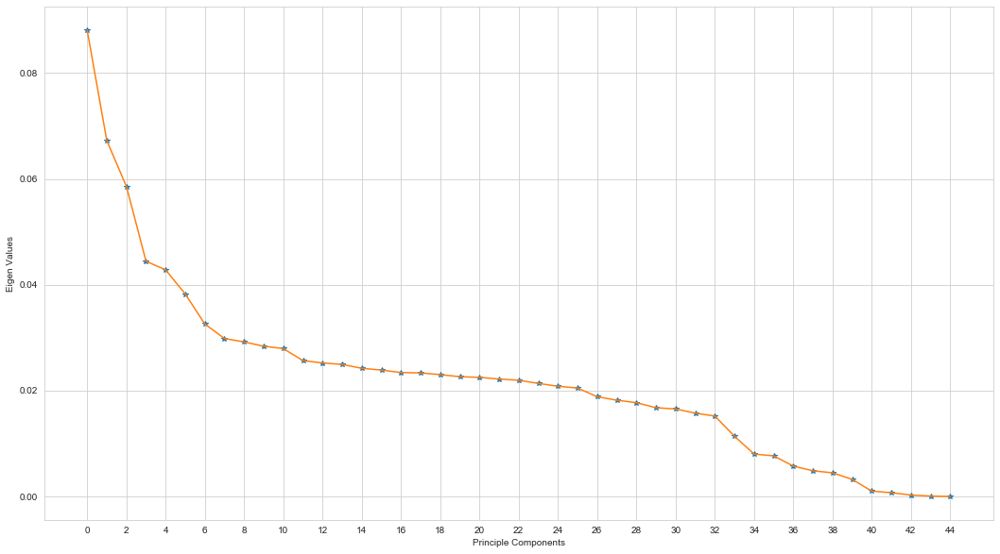

In [82]:
plt.figure(figsize=(18 , 10))

plt.plot(pca.explained_variance_ratio_,'*')
plt.plot(pca.explained_variance_ratio_)
plt.xticks(range(0,45,2))
plt.xlabel('Principle Components')
plt.ylabel('Eigen Values')
plt.show()

From the above plot it is difficult to locate the number of PC’s hence we can say that the scree plot is not so ideal.
In order to deal with a non-ideal scree plot curve, we use Proportion of variance plot where the selected PCs should be able to describe at least 80% of the variance.

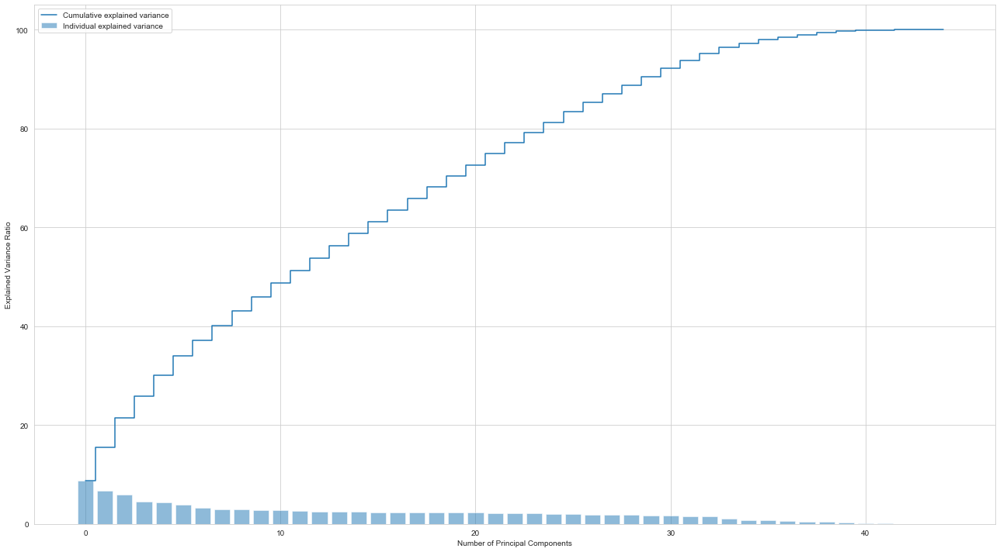

In [83]:
plt.figure(figsize=(18 , 10))
plt.bar(range(45), var_exp, alpha = 0.5, align = 'center', label = 'Individual explained variance')
plt.step(range(45), cum_var_exp, where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Number of Principal Components')
plt.legend(loc = 'best')
plt.tight_layout()
plt.show()

The above proportion of variance plot is plotted, where X-axis is the number of Principle Components and y axis is the percentage of explained variance.We can see that the first thirty PC’s explain over 90% variance of the data; hence we can choose the appropriate number of components accordingly.

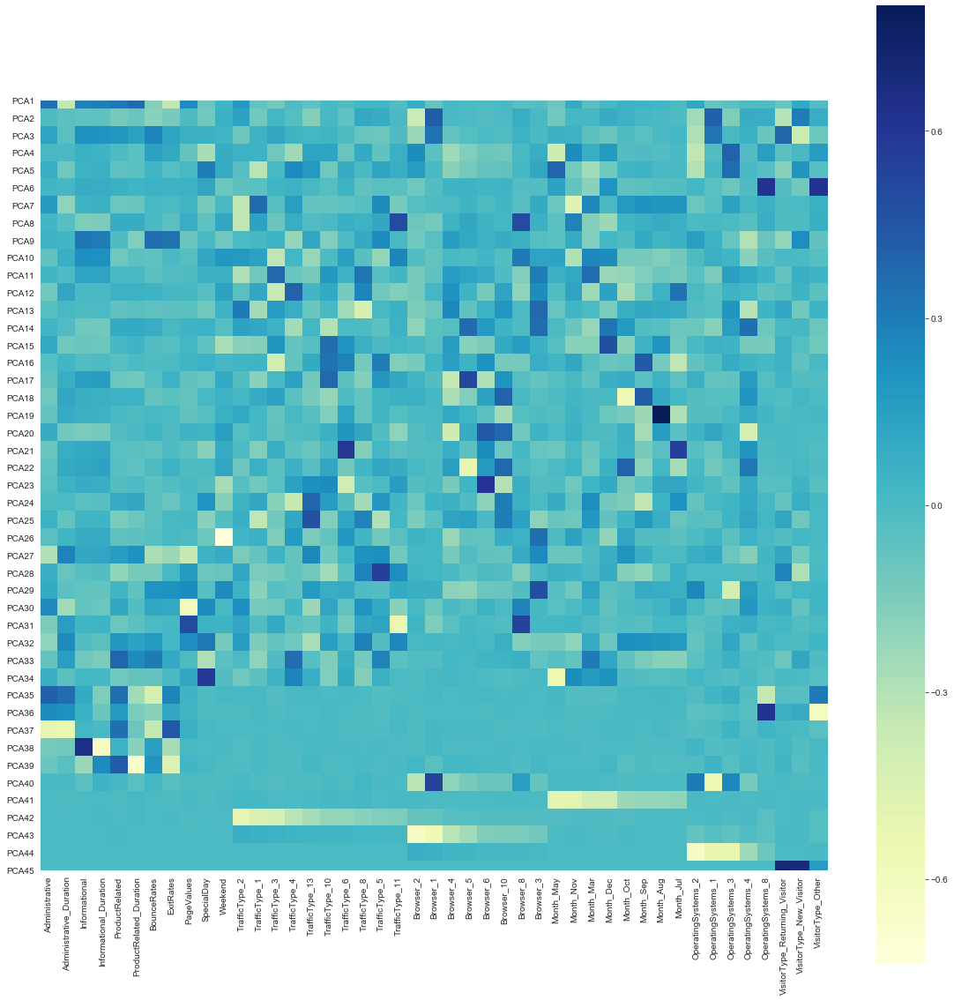

In [88]:
plt.figure(figsize=(20,20))
ax = sns.heatmap(pca.components_,
                 cmap='YlGnBu',
                 yticklabels=[ "PCA"+str(x) for x in range(1,pca.n_components_+1)],
                 xticklabels=list(X.columns))
ax.set_aspect("equal")
plt.savefig('PCA Heatmap.jpeg',bbox_inches='tight',dpi=150)

In [84]:
pca2 = PCA(n_components=2)
X_pca2 = pca2.fit_transform(Xs_pca)

In [85]:
principalDf = pd.DataFrame(data = X_pca2
             , columns = ['principal component 1', 'principal component 2'])

In [86]:
finalDf = pd.concat([principalDf, df_final[['Revenue']]], axis = 1)

In [87]:
X=df_final.drop(columns=['Revenue'],axis=1)

In [89]:
from scipy.spatial import ConvexHull

def encircle(x,y, ax=None, **kw):
    if not ax: ax=plt.gca()
    p = np.c_[x,y]
    hull = ConvexHull(p)
    poly = plt.Polygon(p[hull.vertices,:], **kw)
    ax.add_patch(poly)


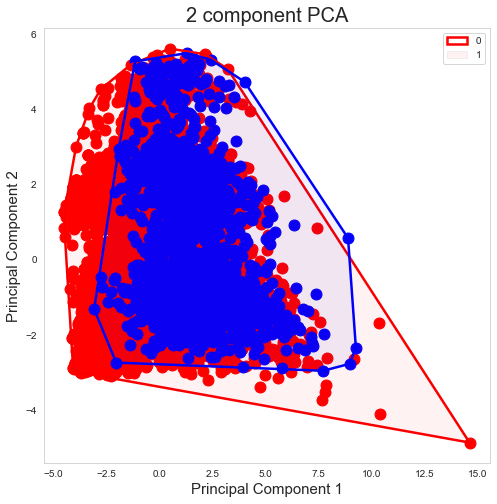

In [90]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = [0, 1]
colors = ['r', 'b']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['Revenue'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 120)
    encircle(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , ec = color, fc="none", linewidth=2.5)
    #shading
    encircle(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , ec = 'k', fc=color, alpha=0.05)
ax.legend(targets)
ax.grid()
plt.savefig('PCA cluster.jpeg',bbox_inches='tight',dpi=150)

In the picture, though there is an overlap, yet the points belonging to the same category are distinctly clustered and region bound. Since we do not have a clear picture in 2D scatter plot, we plot a 3D plot in order to have a clear picture.  

<Figure size 1440x720 with 0 Axes>

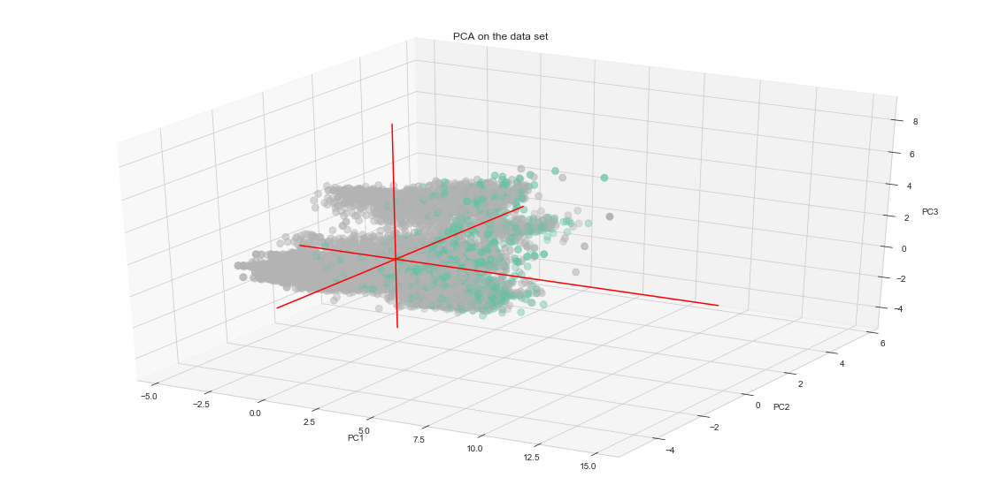

In [91]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

pca = PCA(n_components=3)
pca.fit(Xs_pca)

c['Revenue']=pd.Categorical(df_final['Revenue'])
my_color=c['Revenue'].astype(np.float)

fig = plt.figure(figsize=(20, 10))
 
# Store results of PCA in a data frame
result=pd.DataFrame(pca.transform(Xs_pca), columns=['PCA%i' % i for i in range(3)], index=df.index)
 
# Plot initialisation
fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(result['PCA0'], result['PCA1'], result['PCA2'], c=my_color, cmap="Set2_r", s=60)
 
# make simple, bare axis lines through space:
xAxisLine = ((min(result['PCA0']), max(result['PCA0'])), (0, 0), (0,0))
ax.plot(xAxisLine[0], xAxisLine[1], xAxisLine[2], 'r')
yAxisLine = ((0, 0), (min(result['PCA1']), max(result['PCA1'])), (0,0))
ax.plot(yAxisLine[0], yAxisLine[1], yAxisLine[2], 'r')
zAxisLine = ((0, 0), (0,0), (min(result['PCA2']), max(result['PCA2'])))
ax.plot(zAxisLine[0], zAxisLine[1], zAxisLine[2], 'r')
 
# label the axes
ax.set_xlabel("PC1")
ax.set_ylabel("PC2")
ax.set_zlabel("PC3")
ax.set_title("PCA on the data set")
#plt.show()
plt.savefig('PCA scatter 1.jpeg',bbox_inches='tight',dpi=150)

**INFERENCE**

From the above 3D plot, we can say that, though there is a certain degree of overlap, the points belonging to the same category are distinctly clustered and region bound. This proves that the data captured in the first three PCs is informative enough to discriminate the categories from each other.In other words, we now have evidence that the data is not completely random, but rather can be used to discriminate or explain the Y.

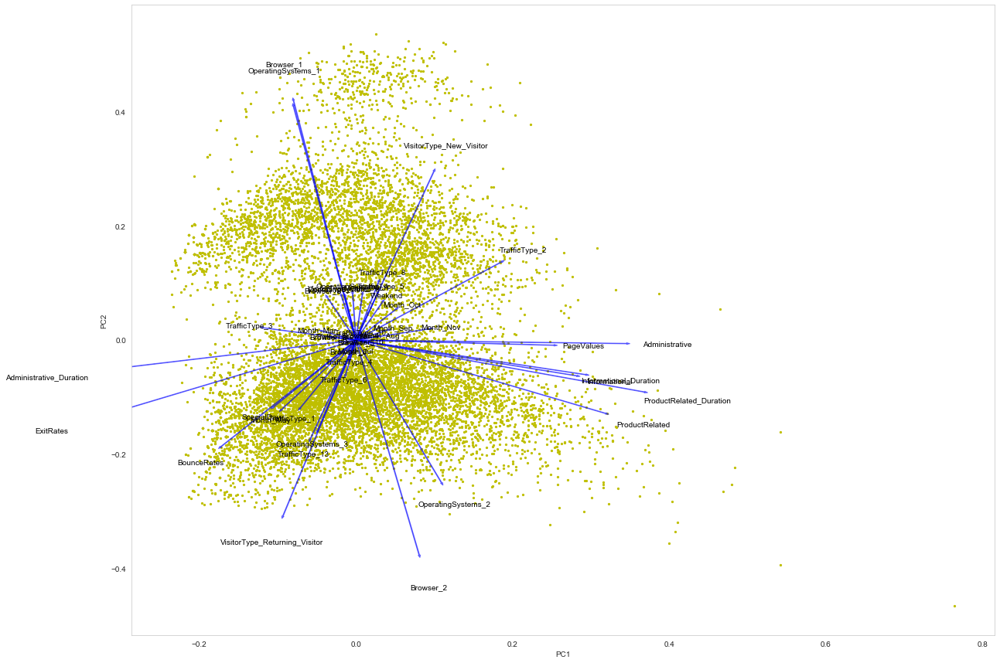

<Figure size 432x288 with 0 Axes>

In [92]:
def myplot(score,coeff,labels=None):
    xs = score[:,0]
    ys = score[:,1]
    n = coeff.shape[0]
    scalex = 1.0/(xs.max() - xs.min())
    scaley = 1.0/(ys.max() - ys.min())
    plt.scatter(xs * scalex,ys * scaley,s=5,c='y')
    for i in range(n):
        plt.arrow(0, 0, coeff[i,0], coeff[i,1],color = 'b',alpha = 0.5)
        if labels is None:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, "Var"+str(i+1), color = 'black', ha = 'center', va = 'center')
        else:
            plt.text(coeff[i,0]* 1.15, coeff[i,1] * 1.15, labels[i], color = 'black', ha = 'center', va = 'center')
 
    plt.xlabel("PC{}".format(1))
    plt.ylabel("PC{}".format(2))
    plt.grid()
plt.figure(figsize=(20,15))
myplot(X_pca[:,0:2],np.transpose(pca.components_[0:2, :]),list(X.columns))
plt.show()
plt.savefig('PCA Biplot.jpeg',bbox_inches='tight',dpi=150)

**INFERENCE**

The PCA biplot represents the variables with calibrated axes and observations as points allowing you to project the observations onto the axes to make an approximation of the original values of the variables.
The angles between the vectors tell us how characteristics correlate with one another

•When two vectors are close, forming a small angle, the two variables they represent are positively correlated. [Browser2 and OperatingSyatem_2]

•If they meet each other at 90°, they are not likely to be correlated. [Administrative_Duration and Browser1]

•When they diverge and form a large angle (close to 180°), they are negative correlated. [Browser2 and Browser1]


>PC   Accuracy   Variance Error
>1     0.551        (0.002)
>2     0.710        (0.002)
>3     0.725        (0.001)
>4     0.727        (0.001)
>5     0.728        (0.001)
>6     0.728        (0.002)
>7     0.801        (0.002)
>8     0.794        (0.002)
>9     0.817        (0.001)
>10     0.814        (0.001)
>11     0.815        (0.001)
>12     0.816        (0.001)
>13     0.814        (0.001)
>14     0.850        (0.001)
>15     0.861        (0.001)
>16     0.861        (0.001)
>17     0.863        (0.001)
>18     0.862        (0.001)
>19     0.862        (0.001)
>20     0.859        (0.001)
>21     0.862        (0.001)
>22     0.862        (0.001)
>23     0.861        (0.001)
>24     0.860        (0.001)
>25     0.858        (0.001)
>26     0.861        (0.001)
>27     0.859        (0.001)
>28     0.860        (0.001)
>29     0.861        (0.001)
>30     0.858        (0.001)
>31     0.859        (0.001)
>32     0.859        (0.001)
>33     0.859        (0.001)
>34     0.860       

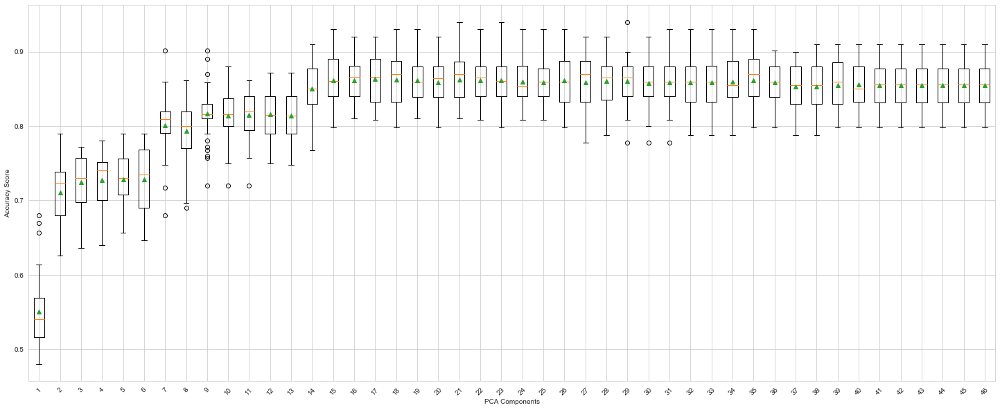

<Figure size 432x288 with 0 Axes>

In [121]:
# compare pca number of components with logistic regression algorithm for classification
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
import matplotlib.pyplot as  plt
 

 
# get a list of models to evaluate
def get_models():
    models = dict()
    for i in range(1,47):
        steps = [('pca', PCA(n_components=i)), ('m', LogisticRegression())]
        models[str(i)] = Pipeline(steps=steps)
    return models
 
# evaluate a given model using cross-validation
def evaluate_model(model):
    cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
    scores = cross_val_score(model, X, y, scoring='accuracy', cv=cv, n_jobs=-1, error_score='raise')
    return scores
 
# define dataset
X, y = get_dataset()
# get the models to evaluate
models = get_models()
# evaluate the models and store results
results, names = list(), list()
print('>PC   Accuracy   Variance Error')
for name, model in models.items():
    scores = evaluate_model(model)
    results.append(scores)
    names.append(name)
    print('>%s     %.3f        (%.3f)' % (name, mean(scores), np.var(scores)))
# plot model performance for comparison
plt.figure(figsize=(25,10))
plt.boxplot(results, labels=names, showmeans=True)
plt.xticks(rotation=45)
plt.xlabel('PCA Components')
plt.ylabel('Accuracy Score')
plt.show()
plt.savefig('PCA logistic.jpeg',bbox_inches='tight',dpi=100)

We see a general trend of increased performance as the number of dimensions is increased. On this dataset, the results suggest a trade-off in the number of dimensions vs. the classification accuracy of the model.
We don’t see any improvement beyond 15 components. This matches our definition of the problem where only the first 15 components contain information about the class and the remaining are redundant.


**Classification Model Evaluation Using PCA Components**

We perform various classification models on PCA components that explain 95% variance of the data and evaluate the results.


# MODEL Using PCA components that explain 95% variance of the data

In [122]:
X=df_final.drop(columns=['Revenue'],axis=1)
y=df_final['Revenue']

In [123]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
Xs_pca=ss.fit_transform(X)

In [124]:
pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(Xs_pca)

In [125]:
X_pca.shape

(12330, 33)

In [103]:
from sklearn.tree import DecisionTreeClassifier
dt_pca=DecisionTreeClassifier(criterion='entropy',random_state=0)

from sklearn.linear_model import LogisticRegression
LR_pca=LogisticRegression()

from sklearn.naive_bayes import GaussianNB
nb_pca=GaussianNB()

from sklearn.metrics import confusion_matrix,accuracy_score,roc_auc_score,roc_curve
from sklearn.ensemble import RandomForestClassifier
rfc_pca=RandomForestClassifier(n_estimators=100,random_state=0)

from sklearn.neighbors import KNeighborsClassifier
knn_pca=KNeighborsClassifier()

from sklearn.ensemble import AdaBoostClassifier
ada_pca=AdaBoostClassifier(random_state=0)

import lightgbm as lgb
lgbm_pca=lgb.LGBMClassifier(random_state=0)

from xgboost import XGBClassifier
xgb_pca=XGBClassifier(random_state=0)

from sklearn import svm
svc_pca=svm.SVC(random_state=0)

In [105]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint

pca_rfc_tunned=RandomForestClassifier(n_estimators=100,random_state=0)
params={'n_estimators':sp_randint(1,100),
        'max_features':sp_randint(1,33),
        'max_depth': sp_randint(2,10),
        'min_samples_split':sp_randint(2,20),
        'min_samples_leaf':sp_randint(1,20),
        'criterion':['gini','entropy']}

rsearch_rfc_pca=RandomizedSearchCV(pca_rfc_tunned,params,cv=3,scoring='roc_auc',n_jobs=-1,random_state=0)

rsearch_rfc_pca.fit(X_pca,y)

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    n_estimators=100,
                                                    n_jobs=None,
 

In [106]:
rsearch_rfc_pca.best_params_

{'criterion': 'entropy',
 'max_depth': 8,
 'max_features': 25,
 'min_samples_leaf': 18,
 'min_samples_split': 7,
 'n_estimators': 26}

In [107]:
pca_rfc_tunned=RandomForestClassifier(**rsearch_rfc_pca.best_params_,random_state=0)

In [108]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV
from scipy.stats import randint as sp_randint

pca_knn_tunned=KNeighborsClassifier()

params={'n_neighbors':sp_randint(1,50),'p':sp_randint(1,5)}

rsearch_knn_pca=RandomizedSearchCV(pca_knn_tunned,params,cv=3,scoring='roc_auc',n_jobs=-1,random_state=0)
rsearch_knn_pca.fit(X_pca,y)

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=KNeighborsClassifier(algorithm='auto',
                                                  leaf_size=30,
                                                  metric='minkowski',
                                                  metric_params=None,
                                                  n_jobs=None, n_neighbors=5,
                                                  p=2, weights='uniform'),
                   iid='warn', n_iter=10, n_jobs=-1,
                   param_distributions={'n_neighbors': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001DC3F43A8C8>,
                                        'p': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001DC3F43AAC8>},
                   pre_dispatch='2*n_jobs', random_state=0, refit=True,
                   return_train_score=False, scoring='roc_auc', verbose=0)

In [110]:
rsearch_knn_pca.best_params_

{'n_neighbors': 45, 'p': 4}

In [111]:
pca_knn_tunned=KNeighborsClassifier(**rsearch_knn_pca.best_params_)

In [112]:
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform 

pca_lgbm_tunned=lgb.LGBMClassifier(random_state=0)
params={'n_estimators':sp_randint(50,200),
       'max_depth': sp_randint(2,15),
        'learning_rate':sp_uniform(0.001,0.05),
        'num_leaves':sp_randint(20,50)
       }

rsearch_lgbm_pca=RandomizedSearchCV(pca_lgbm_tunned,param_distributions=params,cv=3,n_iter=200,n_jobs=-1,random_state=0)

rsearch_lgbm_pca.fit(X_pca,y)

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=LGBMClassifier(boosting_type='gbdt',
                                            class_weight=None,
                                            colsample_bytree=1.0,
                                            importance_type='split',
                                            learning_rate=0.1, max_depth=-1,
                                            min_child_samples=20,
                                            min_child_weight=0.001,
                                            min_split_gain=0.0,
                                            n_estimators=100, n_jobs=-1,
                                            num_leaves=31, objective=None,
                                            random_state=0, reg_alpha=0.0,
                                            reg_la...
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_frozen object at 0x000001DC3F467188

In [113]:
rsearch_lgbm_pca.best_params_

{'learning_rate': 0.027781640151247917,
 'max_depth': 3,
 'n_estimators': 83,
 'num_leaves': 38}

In [114]:
pca_lgbm_tunned=lgb.LGBMClassifier(**rsearch_lgbm_pca.best_params_,random_state=0)

In [115]:
XGB_tunned_pca=XGBClassifier(random_state=0)
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

rsearch_xgb_pca=RandomizedSearchCV(XGB_tunned_pca,param_distributions=params,cv=3,n_iter=200,n_jobs=-1,random_state=0)

rsearch_xgb_pca.fit(X_pca,y)

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_co...
                                           subsample=None, tree_method=None,
                                           validate_parameters=None,
                                           verbosity=None),
                  

In [126]:
rsearch_xgb_pca.best_params_

{'subsample': 1.0,
 'min_child_weight': 10,
 'max_depth': 3,
 'gamma': 5,
 'colsample_bytree': 1.0}

In [127]:
XGB_tunned_pca=XGBClassifier(**rsearch_xgb_pca.best_params_,random_state=0)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint
from sklearn import svm
SVM_tunned_pca=svm.SVC(random_state=0)
params = {'C': [0.1, 1, 10, 100, 1000], 
          'degree': [0, 1, 2, 3, 4, 5, 6],
          'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
          'kernel': ['rbf']} 

rsearch_svm_pca=RandomizedSearchCV(SVM_tunned_pca,param_distributions=params,cv=3,n_iter=200,n_jobs=-1,random_state=0)

rsearch_svm_pca.fit(X_pca,y)

In [ ]:
rsearch_svm_pca.best_params_

In [ ]:
SVM_tunned_pca=svm.SVC(**rsearch_svm_pca.best_params_,random_state=0)

In [128]:
from sklearn.ensemble import VotingClassifier
#hard_voting_pca=VotingClassifier(estimators=[('Logistic',LR),('Random Forest Tunned',rfc_tunned),('LGBM Tunned',lgbm_tunned)],voting='hard',flatten_transform=False)

soft_voting_pca=VotingClassifier(estimators=[('Logistic',LR_pca),('Random Forest Tunned',pca_rfc_tunned),('LGBM Tunned',pca_lgbm_tunned)],voting='soft')

weighted_soft_pca=VotingClassifier(estimators=[('Logistic',LR_pca),('Random Forest Tunned',pca_rfc_tunned),('LGBM Tunned',pca_lgbm_tunned)],weights=[3,1,2],voting='soft')
#weighted_hard_pca=VotingClassifier(estimators=[('Logistic',LR),('Random Forest Tunned',rfc_tunned),('LGBM Tunned',lgbm_tunned)],weights=[3,1,2],voting='hard',flatten_transform=False)

In [129]:
models_pca=[]
models_pca.append(('Logistic',LR_pca))
models_pca.append(('Decision Tree',dt_pca))
models_pca.append(('Naive Bayes',nb_pca))
models_pca.append(('Random Forest',rfc_pca))
models_pca.append(('Random Forest Tunned',pca_rfc_tunned))
models_pca.append(('KNN',knn_pca))
models_pca.append(('KNN Tunned',pca_knn_tunned))
models_pca.append(('Ada-Boost',ada_pca))
models_pca.append(('LGBM',lgbm_pca))
models_pca.append(('LGBM Tunned',pca_lgbm_tunned))
#models_pca.append(('Hard Voting',hard_voting_pca))
#models_pca.append(('Weighted Hard Voting',weighted_hard_pca))
models_pca.append(('Soft Voting',soft_voting_pca))
models_pca.append(('Weighted Soft Voting',weighted_soft_pca))
models_pca.append(('XG Boost',xgb_pca))
models_pca.append(('XG Boost Tuned',XGB_tunned_pca))
models_pca.append(('SVM',svc_pca))
#models_pca.append(('SVM Tuned',SVM_tunned_pca))

In [130]:
from sklearn.model_selection import cross_val_score
from sklearn import model_selection
from sklearn import metrics
from sklearn.model_selection import train_test_split

results_pca=[]
acc_score_pca=[]
auc_score_pca=[]
bias_pca=[]
f1_score_pca=[]
precision_score_pca=[]
recall_score_pca=[]
names_pca=[]
for name,model in models_pca:
    kfold=model_selection.KFold(shuffle=True,n_splits=10,random_state=0)
    cv_results=model_selection.cross_val_score(model,X_pca,y,cv=kfold,scoring='roc_auc')
    results_pca.append(cv_results)
    bias_pca.append(np.var(cv_results,ddof=1))
    auc_score_pca.append(np.mean(cv_results))
    f1=model_selection.cross_val_score(model,X_pca,y,cv=kfold,scoring='f1_weighted')
    f1_score_pca.append(np.mean(f1))
    
    acc=model_selection.cross_val_score(model,X_pca,y,cv=kfold,scoring='accuracy')
    acc_score_pca.append(np.mean(acc))
    
    p=model_selection.cross_val_score(model,X_pca,y,cv=kfold,scoring='precision_weighted')
    precision_score_pca.append(np.mean(p))
    
    r=model_selection.cross_val_score(model,X_pca,y,cv=kfold,scoring='recall_weighted')
    recall_score_pca.append(np.mean(r))
    
    names_pca.append(name)

result_pca_df=pd.DataFrame({'model':names_pca,
                           'Accuracy Score':acc_score_pca,
                            'auc':auc_score_pca,
                            'Bias error':bias_pca,
                            'f1':f1_score_pca,
                            'Precision':precision_score_pca,
                            'Recall':recall_score_pca})

In [131]:
result_pca_df

,model,Accuracy Score,auc,Bias error,f1,Precision,Recall
0,Logistic,0.893836,0.911378,0.000085,0.890713,0.889070,0.893836
1,Decision Tree,0.857421,0.732587,0.000471,0.857963,0.858914,0.857421
2,Naive Bayes,0.861800,0.877820,0.000130,0.861877,0.862281,0.861800
3,Random Forest,0.891971,0.913437,0.000062,0.883386,0.883033,0.891971
4,Random Forest Tunned,0.891646,0.918008,0.000049,0.885014,0.883366,0.891646
5,KNN,0.870803,0.834080,0.000145,0.857626,0.855375,0.870803
6,KNN Tunned,0.856610,0.878290,0.000070,0.813318,0.836228,0.856610
7,Ada-Boost,0.887105,0.905667,0.000084,0.881770,0.879561,0.887105
8,LGBM,0.894972,0.919648,0.000050,0.890041,0.888472,0.894972
9,LGBM Tunned,0.884509,0.906468,0.000064,0.872778,0.872925,0.884509


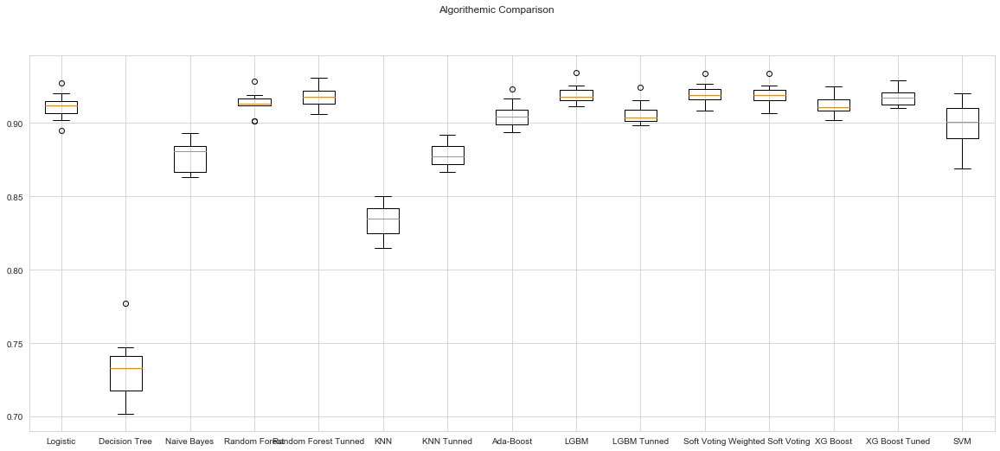

In [133]:
fig=plt.figure(figsize=(20,8))
fig.suptitle('Algorithemic Comparison')
ax=fig.add_subplot(111)

plt.boxplot(results_pca)
ax.set_xticklabels(names_pca)
plt.show()

### SCALING THE DATA

In [146]:
X=df_final.drop(columns=['Revenue'],axis=1)
y=df_final['Revenue']

In [147]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
Xs_fa=ss.fit_transform(X)

# 6.MODELING AND COMPARISON OF MODELS

**The entire modeling section can be divided into:**
 
1)Modeling without SMOTE

2)Modeling with SMOTE

3)Using K-Fold Cross Validation to validate and select the models.

**Models built:**
    
1) Logistic Regression

2) KNN

3) CART models

4) Naive Bayes

5) Boosting models - AdaBoost, LightGBM, XGBoost

In [35]:
import statsmodels.api as sm

In [36]:
from statsmodels.tools import add_constant
df_constant = add_constant(df_final)
df_constant.head()

,const,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Weekend,Revenue,TrafficType_2,TrafficType_1,TrafficType_3,TrafficType_4,TrafficType_13,TrafficType_10,TrafficType_6,TrafficType_8,TrafficType_5,TrafficType_11,Browser_2,Browser_1,Browser_4,Browser_5,Browser_6,Browser_10,Browser_8,Browser_3,Month_May,Month_Nov,Month_Mar,Month_Dec,Month_Oct,Month_Sep,Month_Aug,Month_Jul,OperatingSystems_2,OperatingSystems_1,OperatingSystems_3,OperatingSystems_4,OperatingSystems_8,VisitorType_Returning_Visitor,VisitorType_New_Visitor,VisitorType_Other
0,1.0,0,1.0,0,0.0,1,0.000000,0.724780,0.724780,0.0,0.0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0
1,1.0,0,1.0,0,0.0,2,6.990788,0.000000,0.630957,0.0,0.0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0
2,1.0,0,1.0,0,0.0,1,0.000000,0.724780,0.724780,0.0,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0
3,1.0,0,1.0,0,0.0,2,1.513204,0.549280,0.674879,0.0,0.0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
4,1.0,0,1.0,0,0.0,10,14.727490,0.457305,0.549280,0.0,0.0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0


In [37]:
X=df_final.drop(columns=['Revenue','ExitRates'],axis=1)
y=df_final['Revenue']
X=X.astype(float)

#Xc=sm.add_constant(X)

In [38]:
model = sm.Logit(y,X)
result = model.fit()
result.summary()

Optimization terminated successfully.
         Current function value: 0.245505
         Iterations 8


<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Revenue   No. Observations:                12330
Model:                          Logit   Df Residuals:                    12286
Method:                           MLE   Df Model:                           43
Date:                Wed, 02 Sep 2020   Pseudo R-squ.:                  0.4302
Time:                        11:36:47   Log-Likelihood:                -3027.1
converged:                       True   LL-Null:                       -5312.4
Covariance Type:            nonrobust   LLR p-value:                     0.000
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Administrative                   -0.0833      0.012     -6.774      0.000      -0.107      -0.059
Administrative_Duration           0.0115      0.097      0.119      0.905      -0.178       0.201
Informational                    -0.0001      0.034     -0.004      0.997      -0.066       0.066
Informational_Duration           -0.0382      0.131     -0.293      0.770      -0.294       0.218
ProductRelated                    0.0016      0.001      1.669      0.095      -0.000       0.004
ProductRelated_Duration           0.0154      0.009      1.684      0.092      -0.003       0.033
BounceRates                      -1.3916      0.185     -7.522      0.000      -1.754      -1.029
PageValues                        5.7497      0.126     45.485      0.000       5.502       5.997
SpecialDay                       -0.2653      0.250     -1.063      0.288      -0.754       0.224
Weekend                           0.0624      0.078      0.799      0.425      -0.091       0.215
TrafficType_2                    -0.1198      0.212     -0.564      0.573      -0.536       0.296
TrafficType_1                    -0.5304      0.223     -2.382      0.017      -0.967      -0.094
TrafficType_3                    -0.4867      0.229     -2.123      0.034      -0.936      -0.037
TrafficType_4                    -0.2419      0.238     -1.016      0.310      -0.709       0.225
TrafficType_13                   -0.8571      0.281     -3.048      0.002      -1.408      -0.306
TrafficType_10                    0.0357      0.264      0.135      0.892      -0.481       0.553
TrafficType_6                    -0.4316      0.279     -1.549      0.121      -0.978       0.115
TrafficType_8                     0.3692      0.271      1.362      0.173      -0.162       0.900
TrafficType_5                     0.0959      0.300      0.319      0.749      -0.492       0.684
TrafficType_11                    0.1160      0.304      0.381      0.703      -0.480       0.712
Browser_2                        -0.3056      0.388     -0.787      0.431      -1.067       0.456
Browser_1                        -0.2356      0.426     -0.553      0.580      -1.071       0.600
Browser_4                        -0.3364      0.410     -0.821      0.411      -1.139       0.466
Browser_5                        -0.0853      0.421     -0.203      0.839      -0.911       0.740
Browser_6                        -0.9778      0.490     -1.996      0.046      -1.938      -0.018
Browser_10                       -0.0215      0.471     -0.046      0.964      -0.945       0.902
Browser_8                         0.0944      0.543      0.174      0.862      -0.971       1.160
Browser_3                        -0.9080      0.642     -1.415      0.157      -2.166       0.350
Month_May                        -0.1603      0.238     -0.673      0.501      -0.628       0.307
Month_Nov                         1.2323      0.236      5.231      0.000       0.771       1.694
Month_M

## FEATURE SELECTION

### BACKWARD ELIMINATION

After the transformation process, the number of features increased to 46. Backward Elimination Feature Selection method was used for feature selection. Backward elimination is a feature selection technique while building a machine learning model. It is used to remove those features that do not have a significant effect on the dependent variable or prediction of output. The p-values of the features greater than 0.05 were eliminated. After the feature selection process, the number of features was reduced to 19.

In [39]:
cols = X.columns

In [40]:
def back_feature_elim(data_frame,dep_var,col_list):
    while len(col_list)>0:
        model = sm.Logit(dep_var,data_frame[col_list].astype(float))
        result = model.fit(disp=0)
        largest_pvalue = round(result.pvalues,3).nlargest(1)
        if largest_pvalue[0]<(0.05):
            return result
            break
        else:
            col_list = col_list.drop(largest_pvalue.index)
            
    selected_features_BE = col_list
    print(selected_features_BE)
result = back_feature_elim(df_constant,df_constant.Revenue,cols)     

In [41]:
result.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                Revenue   No. Observations:                12330
Model:                          Logit   Df Residuals:                    12311
Method:                           MLE   Df Model:                           18
Date:                Wed, 02 Sep 2020   Pseudo R-squ.:                  0.4281
Time:                        11:36:58   Log-Likelihood:                -3038.1
converged:                       True   LL-Null:                       -5312.4
Covariance Type:            nonrobust   LLR p-value:                     0.000
=================================================================================================
                                    coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Administrative                   -0.0833      0.010     -8.150      0.000      -0.103      -0.063
ProductRelated                    0.0027      0.001      3.844      0.000       0.001       0.004
BounceRates                      -1.4457      0.177     -8.170      0.000      -1.793      -1.099
PageValues                        5.7956      0.119     48.851      0.000       5.563       6.028
TrafficType_2                    -0.2509      0.099     -2.531      0.011      -0.445      -0.057
TrafficType_1                    -0.6414      0.123     -5.228      0.000      -0.882      -0.401
TrafficType_3                    -0.6433      0.132     -4.872      0.000      -0.902      -0.385
TrafficType_4                    -0.4439      0.144     -3.090      0.002      -0.725      -0.162
TrafficType_13                   -1.0507      0.207     -5.068      0.000      -1.457      -0.644
TrafficType_6                    -0.5990      0.205     -2.921      0.003      -1.001      -0.197
Browser_6                        -0.6701      0.302     -2.219      0.026      -1.262      -0.078
Month_Nov                         1.3334      0.081     16.544      0.000       1.175       1.491
Month_Oct                         0.5010      0.150      3.336      0.001       0.207       0.795
Month_Sep                         0.5931      0.167      3.553      0.000       0.266       0.920
Month_Aug                         0.6313      0.178      3.555      0.000       0.283       0.979
Month_Jul                         0.6760      0.183      3.695      0.000       0.317       1.035
VisitorType_Returning_Visitor    -3.1664      0.113    -27.929      0.000      -3.389      -2.944
VisitorType_New_Visitor          -2.4385      0.116    -21.011      0.000      -2.666      -2.211
VisitorType_Other                -2.8253      0.398     -7.095      0.000      -3.606      -2.045
=================================================================================================
"""

# Model Using selected Features

In [42]:
X=df_final[['Administrative','ProductRelated','BounceRates','PageValues','TrafficType_2',
           'TrafficType_1','TrafficType_3','TrafficType_4','TrafficType_13','TrafficType_6','Browser_6','Month_Nov','Month_Oct',
          'Month_Sep','Month_Aug','Month_Jul','VisitorType_Returning_Visitor','VisitorType_New_Visitor','VisitorType_Other']]
X.head()

,Administrative,ProductRelated,BounceRates,PageValues,TrafficType_2,TrafficType_1,TrafficType_3,TrafficType_4,TrafficType_13,TrafficType_6,Browser_6,Month_Nov,Month_Oct,Month_Sep,Month_Aug,Month_Jul,VisitorType_Returning_Visitor,VisitorType_New_Visitor,VisitorType_Other
0,0,1,0.724780,0.0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,2,0.000000,0.0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,0,1,0.724780,0.0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
3,0,2,0.549280,0.0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0
4,0,10,0.457305,0.0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0


In [43]:
import statsmodels.api as sm
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report,roc_auc_score,log_loss,f1_score

In [44]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
Xs=ss.fit_transform(X)

# Base Model

In [104]:
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier(criterion='entropy',random_state=0)

from sklearn.linear_model import LogisticRegression
LR=LogisticRegression()

from sklearn.naive_bayes import GaussianNB
nb=GaussianNB()

from sklearn.metrics import confusion_matrix,accuracy_score,roc_auc_score,roc_curve
from sklearn.ensemble import RandomForestClassifier
rfc=RandomForestClassifier(n_estimators=100,random_state=0)

from sklearn.neighbors import KNeighborsClassifier
knn=KNeighborsClassifier()

from sklearn.ensemble import AdaBoostClassifier,BaggingClassifier,GradientBoostingClassifier
ada=AdaBoostClassifier(random_state=0)
gb=GradientBoostingClassifier(random_state=0)
bc=BaggingClassifier(random_state=0)

import lightgbm as lgb
lgbm=lgb.LGBMClassifier(random_state=0)

from xgboost import XGBClassifier
xgb=XGBClassifier(random_state=0)

from sklearn import svm
svc=svm.SVC(random_state=0)

# Random Forest Hyper tunned

In [105]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint

rfc_tunned=RandomForestClassifier(n_estimators=100,random_state=0)
params={'n_estimators':sp_randint(1,100),
        'max_features':sp_randint(1,20),
        'max_depth': sp_randint(2,10),
        'min_samples_split':sp_randint(2,20),
        'min_samples_leaf':sp_randint(1,20),
        'criterion':['gini','entropy']}

rsearch_rfc=RandomizedSearchCV(rfc_tunned,params,cv=3,scoring='roc_auc',n_jobs=-1,random_state=0)

rsearch_rfc.fit(Xs,y)

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    n_estimators=100,
                                                    n_jobs=None,
 

In [106]:
rsearch_rfc.best_params_

{'criterion': 'entropy',
 'max_depth': 6,
 'max_features': 10,
 'min_samples_leaf': 11,
 'min_samples_split': 3,
 'n_estimators': 66}

In [107]:
rfc_tunned=RandomForestClassifier(**rsearch_rfc.best_params_,random_state=0)

# KNN Hyper Tunned

In [108]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV
from scipy.stats import randint as sp_randint

knn_tunned=KNeighborsClassifier()

params={'n_neighbors':sp_randint(1,20),'p':sp_randint(1,5)}

rsearch_knn=RandomizedSearchCV(knn_tunned,params,cv=3,scoring='roc_auc',n_jobs=-1,random_state=0)
rsearch_knn.fit(Xs,y)

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=KNeighborsClassifier(algorithm='auto',
                                                  leaf_size=30,
                                                  metric='minkowski',
                                                  metric_params=None,
                                                  n_jobs=None, n_neighbors=5,
                                                  p=2, weights='uniform'),
                   iid='warn', n_iter=10, n_jobs=-1,
                   param_distributions={'n_neighbors': <scipy.stats._distn_infrastructure.rv_frozen object at 0x00000201DB862DC8>,
                                        'p': <scipy.stats._distn_infrastructure.rv_frozen object at 0x00000201DB862D48>},
                   pre_dispatch='2*n_jobs', random_state=0, refit=True,
                   return_train_score=False, scoring='roc_auc', verbose=0)

In [109]:
rsearch_knn.best_params_

{'n_neighbors': 19, 'p': 1}

In [110]:
knn_tunned=KNeighborsClassifier(**rsearch_knn.best_params_)

# LGBM Tunned

In [111]:
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform 

lgbm_tunned=lgb.LGBMClassifier(random_state=0)
params={'n_estimators':sp_randint(50,200),
       'max_depth': sp_randint(2,15),
        'learning_rate':sp_uniform(0.001,0.05),
        'num_leaves':sp_randint(20,50)
       }

rsearch_lgbm=RandomizedSearchCV(lgbm_tunned,param_distributions=params,cv=3,n_iter=200,n_jobs=-1,random_state=0)

rsearch_lgbm.fit(Xs,y)

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=LGBMClassifier(boosting_type='gbdt',
                                            class_weight=None,
                                            colsample_bytree=1.0,
                                            importance_type='split',
                                            learning_rate=0.1, max_depth=-1,
                                            min_child_samples=20,
                                            min_child_weight=0.001,
                                            min_split_gain=0.0,
                                            n_estimators=100, n_jobs=-1,
                                            num_leaves=31, objective=None,
                                            random_state=0, reg_alpha=0.0,
                                            reg_la...
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_frozen object at 0x00000201DB8777C8

In [112]:
rsearch_lgbm.best_params_

{'learning_rate': 0.01464109512122335,
 'max_depth': 10,
 'n_estimators': 96,
 'num_leaves': 20}

In [113]:
lgbm_tunned=lgb.LGBMClassifier(**rsearch_lgbm.best_params_,random_state=0)

In [114]:
XGB_tunned=XGBClassifier(random_state=0)
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

rsearch_xgb=RandomizedSearchCV(XGB_tunned,param_distributions=params,cv=3,n_iter=200,n_jobs=-1,random_state=0)

rsearch_xgb.fit(Xs,y)

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_co...
                                           subsample=None, tree_method=None,
                                           validate_parameters=None,
                                           verbosity=None),
                  

In [117]:
rsearch_xgb.best_params_

{'subsample': 1.0,
 'min_child_weight': 10,
 'max_depth': 4,
 'gamma': 5,
 'colsample_bytree': 1.0}

In [118]:
XGB_tunned=XGBClassifier(**rsearch_xgb.best_params_,random_state=0)

In [119]:
from sklearn import svm
SVM_tunned=svm.SVC(random_state=0)
params = {'C': [0.1, 1, 10, 100, 1000], 
          'degree': [0, 1, 2, 3, 4, 5, 6],
          'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
          'kernel': ['rbf']} 

rsearch_svm=RandomizedSearchCV(SVM_tunned,param_distributions=params,cv=3,n_iter=200,n_jobs=-1,random_state=0)

rsearch_svm.fit(Xs,y)

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=SVC(C=1.0, cache_size=200, class_weight=None,
                                 coef0=0.0, decision_function_shape='ovr',
                                 degree=3, gamma='auto_deprecated',
                                 kernel='rbf', max_iter=-1, probability=False,
                                 random_state=0, shrinking=True, tol=0.001,
                                 verbose=False),
                   iid='warn', n_iter=200, n_jobs=-1,
                   param_distributions={'C': [0.1, 1, 10, 100, 1000],
                                        'degree': [0, 1, 2, 3, 4, 5, 6],
                                        'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                                        'kernel': ['rbf']},
                   pre_dispatch='2*n_jobs', random_state=0, refit=True,
                   return_train_score=False, scoring=None, verbose=0)

In [120]:
rsearch_svm.best_params_

{'kernel': 'rbf', 'gamma': 0.1, 'degree': 0, 'C': 0.1}

In [122]:
SVM_tunned=svm.SVC(**rsearch_svm.best_params_,random_state=0)

# Stacking

In [123]:
from sklearn.ensemble import VotingClassifier
#hard_voting=VotingClassifier(estimators=[('Logistic',LR),('Random Forest Tunned',rfc_tunned),('LGBM Tunned',lgbm_tunned)],voting='hard',flatten_transform=False)

soft_voting=VotingClassifier(estimators=[('Logistic',LR),('Random Forest Tunned',rfc_tunned),('LGBM Tunned',lgbm_tunned)],voting='soft')

weighted_soft=VotingClassifier(estimators=[('Logistic',LR),('Random Forest Tunned',rfc_tunned),('LGBM Tunned',lgbm_tunned)],weights=[3,1,2],voting='soft')
#weighted_hard=VotingClassifier(estimators=[('Logistic',LR),('Random Forest Tunned',rfc_tunned),('LGBM Tunned',lgbm_tunned)],weights=[3,1,2],voting='hard',flatten_transform=False)

In [124]:
models_b=[]
models_b.append(('Logistic',LR))
models_b.append(('Decision Tree',dt))
models_b.append(('Naive Bayes',nb))
models_b.append(('Random Forest',rfc))
models_b.append(('KNN',knn))

Logistic:0.913721(0.000089)
Decision Tree:0.731016(0.000135)
Naive Bayes:0.850709(0.000177)
Random Forest:0.910464(0.000107)
KNN:0.867192(0.000114)


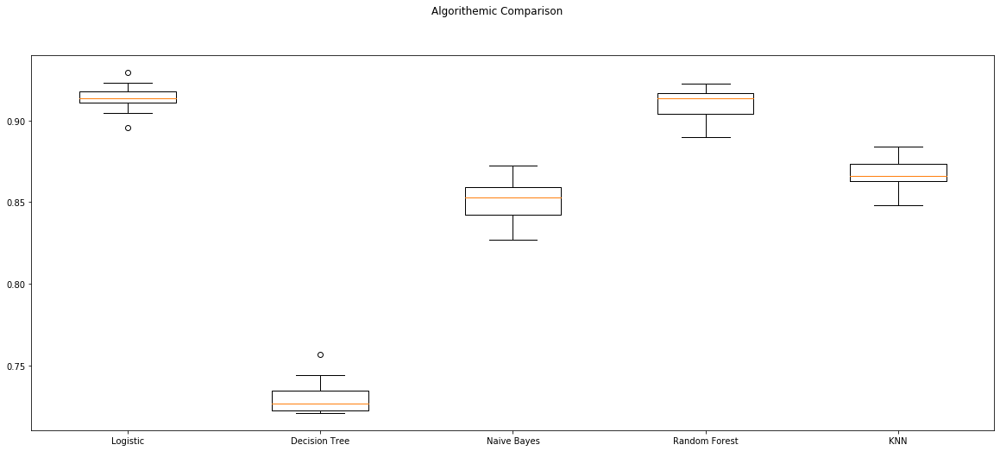

In [125]:
from sklearn.model_selection import cross_val_score
from sklearn import model_selection
from sklearn import metrics
from sklearn.model_selection import train_test_split


results=[]
names=[]
for name,model in models_b:
    kfold=model_selection.KFold(shuffle=True,n_splits=10,random_state=0)
    cv_results=model_selection.cross_val_score(model,Xs,y,cv=kfold,scoring='roc_auc')
    results.append(cv_results)
    names.append(name)
    print('%s:%f(%f)'% (name,np.mean(cv_results),np.var(cv_results,ddof=1)))
    
fig=plt.figure(figsize=(20,8))
fig.suptitle('Algorithemic Comparison')
ax=fig.add_subplot(111)
plt.boxplot(results)
ax.set_xticklabels(names)
plt.show()
#plt.savefig('BaseModel.jpeg',dpi=100)

In [126]:
models_a=[]
models_a.append(('Logistic',LR))
models_a.append(('Decision Tree',dt))
models_a.append(('Naive Bayes',nb))
models_a.append(('Random Forest',rfc))
models_a.append(('Random Forest Tuned',rfc_tunned))
models_a.append(('KNN',knn))
models_a.append(('KNN Tunned',knn_tunned))
models_a.append(('Bagging',bc))
models_a.append(('Ada-Boost',ada))
models_a.append(('Gradient Boost',gb))
models_a.append(('LGBM',lgbm))
models_a.append(('LGBM Tunned',lgbm_tunned))
#models.append(('Hard Voting',hard_voting))
#models.append(('Weighted Hard Voting',weighted_hard))
models_a.append(('Soft Voting',soft_voting))
models_a.append(('Weighted Soft Voting',weighted_soft))
models_a.append(('XG Boost',xgb))
models_a.append(('XG Boost Tuned',XGB_tunned))
models_a.append(('SVM Tuned',SVM_tunned))

In [127]:
from sklearn.model_selection import cross_val_score
from sklearn import model_selection
from sklearn import metrics
from sklearn.model_selection import train_test_split

results_a=[]
acc_score_a=[]
auc_score_a=[]
bias_a=[]
f1_score_a=[]
precision_score_a=[]
recall_score_a=[]
names_a=[]
for name,model in models_a:
    kfold=model_selection.KFold(shuffle=True,n_splits=10,random_state=0)
    cv_results=model_selection.cross_val_score(model,Xs,y,cv=kfold,scoring='roc_auc')
    results_a.append(cv_results)
    bias_a.append(np.var(cv_results,ddof=1))
    auc_score_a.append(np.mean(cv_results))
    
    f1=model_selection.cross_val_score(model,Xs,y,cv=kfold,scoring='f1_weighted')
    f1_score_a.append(np.mean(f1))
    
    acc=model_selection.cross_val_score(model,Xs,y,cv=kfold,scoring='accuracy')
    acc_score_a.append(np.mean(acc))
    
    p=model_selection.cross_val_score(model,Xs,y,cv=kfold,scoring='precision_weighted')
    precision_score_a.append(np.mean(p))
    
    r=model_selection.cross_val_score(model,Xs,y,cv=kfold,scoring='recall_weighted')
    recall_score_a.append(np.mean(r))
    
    names_a.append(name)
    
result_df=pd.DataFrame({'Model':names_a,
                        'Accuracy Score':acc_score_a,
                        'ROC-AUC Score':auc_score_a,
                        'Bias error':bias_a,
                        'F1 Score':f1_score_a,
                        'Precision':precision_score_a,
                        'Recall':recall_score_a})

In [128]:
result_df

,Model,Accuracy Score,ROC-AUC Score,Bias error,F1 Score,Precision,Recall
0,Logistic,0.898216,0.913721,0.000089,0.895426,0.894114,0.898216
1,Decision Tree,0.859124,0.731016,0.000135,0.859318,0.859691,0.859124
2,Naive Bayes,0.817275,0.850709,0.000177,0.834479,0.870835,0.817275
3,Random Forest,0.893512,0.910464,0.000107,0.889568,0.887841,0.893512
4,Random Forest Tuned,0.903001,0.931686,0.000040,0.899292,0.897989,0.903001
5,KNN,0.888808,0.867192,0.000114,0.884844,0.882936,0.888808
6,KNN Tunned,0.895945,0.911575,0.000105,0.890543,0.889141,0.895945
7,Bagging,0.886131,0.878637,0.000112,0.881303,0.879118,0.886131
8,Ada-Boost,0.892620,0.916920,0.000050,0.888373,0.886542,0.892620
9,Gradient Boost,0.901784,0.929015,0.000055,0.898248,0.896919,0.901784


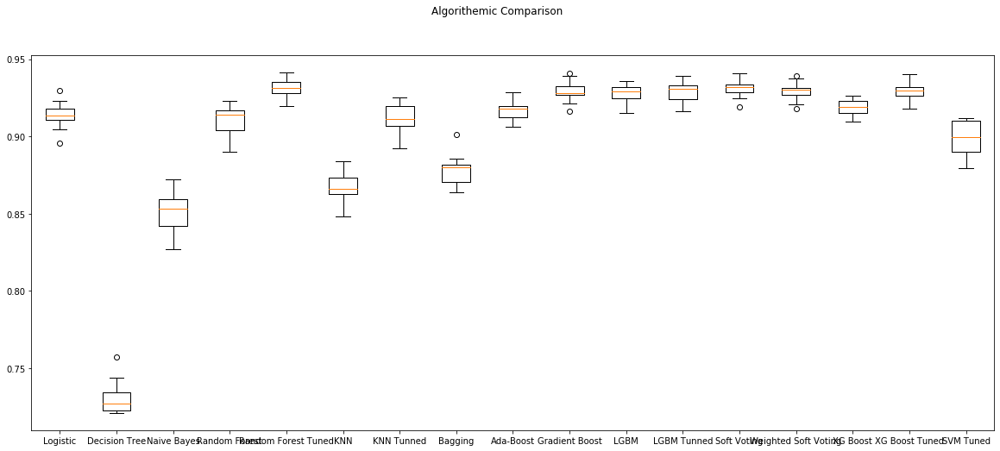

In [129]:
fig=plt.figure(figsize=(20,8))
fig.suptitle('Algorithemic Comparison')
ax=fig.add_subplot(111)
plt.boxplot(results_a)
ax.set_xticklabels(names_a)
plt.show()

# SMOTE

In [130]:
from imblearn.over_sampling import SMOTE
smote=SMOTE(sampling_strategy='minority',random_state=0)

X_sm,y_sm=smote.fit_sample(Xs,y)

In [131]:
y.value_counts() #Target before smote

0    10422
1     1908
Name: Revenue, dtype: int64

In [132]:
pd.Series(y_sm).value_counts() #target After Smote

1    10422
0    10422
dtype: int64

# Model After SMOTE

It was observed from that the dataset is biased towards ‘0’ revenues. This actually affects any model that we train and predict. The biggest problem is that even though all the models have a higher accuracy for predicting ‘0’ revenues, accuracy of predicting ‘1’ revenues is very low.

To cater this situation, SMOTE is used in order to oversample the imbalanced data and create a balance in the revenues.

In [133]:
from sklearn.tree import DecisionTreeClassifier
dt_sm=DecisionTreeClassifier(criterion='entropy',random_state=0)

from sklearn.linear_model import LogisticRegression
LR_sm=LogisticRegression()

from sklearn.naive_bayes import GaussianNB
nb_sm=GaussianNB()

from sklearn.metrics import confusion_matrix,accuracy_score,roc_auc_score,roc_curve
from sklearn.ensemble import RandomForestClassifier
rfc_sm=RandomForestClassifier(n_estimators=100,random_state=0)

from sklearn.neighbors import KNeighborsClassifier
knn_sm=KNeighborsClassifier()

from sklearn.ensemble import AdaBoostClassifier,BaggingClassifier,GradientBoostingClassifier
ada_sm=AdaBoostClassifier(random_state=0)
gb_sm=GradientBoostingClassifier(random_state=0)
bc_sm=BaggingClassifier(random_state=0)

import lightgbm as lgb
lgbm_sm=lgb.LGBMClassifier(random_state=0)

from xgboost import XGBClassifier
xgb_sm=XGBClassifier(random_state=0)

from sklearn import svm
svc_sm=svm.SVC(random_state=0)

# Tuning RFC

In [134]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint

sm_rfc_tunned=RandomForestClassifier(n_estimators=100,random_state=0)
params={'n_estimators':sp_randint(1,1200),
        'max_features':sp_randint(1,20),
        'max_depth': sp_randint(1,60),
        'min_samples_split':sp_randint(2,40),
        'min_samples_leaf':sp_randint(2,20),
        'criterion':['gini','entropy']}

rsearch_rfc_sm=RandomizedSearchCV(sm_rfc_tunned,params,cv=3,scoring='roc_auc',n_jobs=-1,random_state=0)

rsearch_rfc_sm.fit(X_sm,y_sm)

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=RandomForestClassifier(bootstrap=True,
                                                    class_weight=None,
                                                    criterion='gini',
                                                    max_depth=None,
                                                    max_features='auto',
                                                    max_leaf_nodes=None,
                                                    min_impurity_decrease=0.0,
                                                    min_impurity_split=None,
                                                    min_samples_leaf=1,
                                                    min_samples_split=2,
                                                    min_weight_fraction_leaf=0.0,
                                                    n_estimators=100,
                                                    n_jobs=None,
 

In [135]:
rsearch_rfc_sm.best_params_

{'criterion': 'entropy',
 'max_depth': 29,
 'max_features': 3,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'n_estimators': 1078}

In [136]:
sm_rfc_tunned=RandomForestClassifier(**rsearch_rfc_sm.best_params_,random_state=0)

# Tuning Knn

In [137]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import RandomizedSearchCV,GridSearchCV
from scipy.stats import randint as sp_randint

sm_knn_tunned=KNeighborsClassifier()

params={'n_neighbors':sp_randint(1,100),'p':sp_randint(1,60)}

rsearch_knn_sm=RandomizedSearchCV(sm_knn_tunned,params,cv=3,scoring='roc_auc',n_jobs=-1,random_state=0)
rsearch_knn_sm.fit(X_sm,y_sm)

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=KNeighborsClassifier(algorithm='auto',
                                                  leaf_size=30,
                                                  metric='minkowski',
                                                  metric_params=None,
                                                  n_jobs=None, n_neighbors=5,
                                                  p=2, weights='uniform'),
                   iid='warn', n_iter=10, n_jobs=-1,
                   param_distributions={'n_neighbors': <scipy.stats._distn_infrastructure.rv_frozen object at 0x00000201E0C68288>,
                                        'p': <scipy.stats._distn_infrastructure.rv_frozen object at 0x00000201E0C48348>},
                   pre_dispatch='2*n_jobs', random_state=0, refit=True,
                   return_train_score=False, scoring='roc_auc', verbose=0)

In [138]:
rsearch_knn_sm.best_params_

{'n_neighbors': 10, 'p': 20}

In [139]:
sm_knn_tunned=KNeighborsClassifier(**rsearch_knn_sm.best_params_)

# Tuning LGBM

In [140]:
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform 

sm_lgbm_tunned=lgb.LGBMClassifier(random_state=0)
params={'n_estimators':sp_randint(1,500),
       'max_depth': sp_randint(2,20),
        'learning_rate':sp_uniform(0.001,0.05),
        'num_leaves':sp_randint(10,70)
       }

rsearch_lgbm_sm=RandomizedSearchCV(sm_lgbm_tunned,param_distributions=params,cv=3,n_iter=200,n_jobs=-1,random_state=0)

rsearch_lgbm_sm.fit(X_sm,y_sm)

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=LGBMClassifier(boosting_type='gbdt',
                                            class_weight=None,
                                            colsample_bytree=1.0,
                                            importance_type='split',
                                            learning_rate=0.1, max_depth=-1,
                                            min_child_samples=20,
                                            min_child_weight=0.001,
                                            min_split_gain=0.0,
                                            n_estimators=100, n_jobs=-1,
                                            num_leaves=31, objective=None,
                                            random_state=0, reg_alpha=0.0,
                                            reg_la...
                                        'max_depth': <scipy.stats._distn_infrastructure.rv_frozen object at 0x00000201E0B2B488

In [141]:
rsearch_lgbm_sm.best_params_

{'learning_rate': 0.04373067901553573,
 'max_depth': 11,
 'n_estimators': 346,
 'num_leaves': 60}

In [142]:
sm_lgbm_tunned=lgb.LGBMClassifier(**rsearch_lgbm_sm.best_params_,random_state=0)

## XGBOOST TUNING

In [143]:
XGB_tunned_sm=XGBClassifier(random_state=0)
params = {
        'min_child_weight': [1, 5, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 1.0],
        'max_depth': [3, 4, 5]
        }

rsearch_xgb_sm=RandomizedSearchCV(XGB_tunned_sm,param_distributions=params,cv=3,n_iter=200,n_jobs=-1,random_state=0)

rsearch_xgb_sm.fit(X_sm,y_sm)

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None, gamma=None,
                                           gpu_id=None, importance_type='gain',
                                           interaction_constraints=None,
                                           learning_rate=None,
                                           max_delta_step=None, max_depth=None,
                                           min_child_weight=None, missing=nan,
                                           monotone_co...
                                           subsample=None, tree_method=None,
                                           validate_parameters=None,
                                           verbosity=None),
                  

In [144]:
rsearch_xgb_sm.best_params_

{'subsample': 0.6,
 'min_child_weight': 10,
 'max_depth': 5,
 'gamma': 1,
 'colsample_bytree': 0.8}

In [145]:
XGB_tunned_sm=XGBClassifier(**rsearch_xgb_sm.best_params_,random_state=0)

## SVM TUNING

In [146]:
from sklearn import svm
SVM_tunned_sm=svm.SVC(random_state=0)
params = {'C': [0.1, 1, 10, 100, 1000], 
          'degree': [0, 1, 2, 3, 4, 5, 6],
          'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
          'kernel': ['rbf']} 

rsearch_svm_sm=RandomizedSearchCV(SVM_tunned_sm,param_distributions=params,cv=3,n_iter=200,n_jobs=-1,random_state=0)

rsearch_svm_sm.fit(Xs,y)

RandomizedSearchCV(cv=3, error_score='raise-deprecating',
                   estimator=SVC(C=1.0, cache_size=200, class_weight=None,
                                 coef0=0.0, decision_function_shape='ovr',
                                 degree=3, gamma='auto_deprecated',
                                 kernel='rbf', max_iter=-1, probability=False,
                                 random_state=0, shrinking=True, tol=0.001,
                                 verbose=False),
                   iid='warn', n_iter=200, n_jobs=-1,
                   param_distributions={'C': [0.1, 1, 10, 100, 1000],
                                        'degree': [0, 1, 2, 3, 4, 5, 6],
                                        'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                                        'kernel': ['rbf']},
                   pre_dispatch='2*n_jobs', random_state=0, refit=True,
                   return_train_score=False, scoring=None, verbose=0)

In [147]:
rsearch_svm_sm.best_params_

{'kernel': 'rbf', 'gamma': 0.1, 'degree': 0, 'C': 0.1}

In [148]:
SVM_tunned_sm=svm.SVC(**rsearch_svm_sm.best_params_,random_state=0)

## STACKING

In [149]:
from sklearn.ensemble import VotingClassifier
#hard_voting_sm=VotingClassifier(estimators=[('Logistic',LR),('Random Forest Tunned',rfc_tunned),('LGBM Tunned',lgbm_tunned)],voting='hard',flatten_transform=False)

soft_voting_sm=VotingClassifier(estimators=[('Bagging',bc_sm),('LGBM Tunned ',lgbm_sm),('Random Forest Tunned',rfc_sm)],voting='soft')

weighted_soft_sm=VotingClassifier(estimators=[('Bagging',bc_sm),('LGBM Tunned ',lgbm_sm),('Random Forest Tunned',rfc_sm)],weights=[3,1,2],voting='soft')
#weighted_hard_sm=VotingClassifier(estimators=[('Logistic',LR),('Random Forest Tunned',rfc_tunned),('LGBM Tunned',lgbm_tunned)],weights=[3,1,2],voting='hard',flatten_transform=False)

In [150]:
models_sm=[]
models_sm.append(('Logistic',LR_sm))
models_sm.append(('Decision Tree',dt_sm))
models_sm.append(('Naive Bayes',nb_sm))
models_sm.append(('Random Forest',rfc_sm))
models_sm.append(('Random Forest Tunned',sm_rfc_tunned))
models_sm.append(('KNN',knn_sm))
models_sm.append(('KNN Tunned',sm_knn_tunned))
models_sm.append(('Bagging',bc_sm))
models_sm.append(('Ada-Boost',ada_sm))
models_sm.append(('Gradient Boost',gb_sm))
models_sm.append(('LGBM',lgbm_sm))
models_sm.append(('LGBM Tunned',sm_lgbm_tunned))
#models_sm.append(('Hard Voting',hard_voting_sm))
#models_sm.append(('Weighted Hard Voting',weighted_hard_sm))
models_sm.append(('Soft Voting',soft_voting_sm))
models_sm.append(('Weighted Soft Voting',weighted_soft_sm))
models_sm.append(('XG Boost',xgb_sm))
models_sm.append(('XG Boost Tuned',XGB_tunned_sm))
models_sm.append(('SVM',svc_sm))
models_sm.append(('SVM Tuned',SVM_tunned_sm))

## K-FOLD CROSS VALIDATION

In [151]:
results_sm=[]
acc_score_sm=[]
auc_score_sm=[]
bias_sm=[]
f1_score_sm=[]
precision_score_sm=[]
recall_score_sm=[]
names_sm=[]
for name,model in models_sm:
    kfold=model_selection.KFold(shuffle=True,n_splits=10,random_state=0)
    cv_results=model_selection.cross_val_score(model,X_sm,y_sm,cv=kfold,scoring='roc_auc')
    results_sm.append(cv_results)
    bias_sm.append(np.var(cv_results,ddof=1))
    auc_score_sm.append(np.mean(cv_results))
    
    f1=model_selection.cross_val_score(model,X_sm,y_sm,cv=kfold,scoring='f1_weighted')
    f1_score_sm.append(np.mean(f1))
    
    acc=model_selection.cross_val_score(model,X_sm,y_sm,cv=kfold,scoring='accuracy')
    acc_score_sm.append(np.mean(acc))
    
    
    p=model_selection.cross_val_score(model,X_sm,y_sm,cv=kfold,scoring='precision_weighted')
    precision_score_sm.append(np.mean(p))
    
    r=model_selection.cross_val_score(model,X_sm,y_sm,cv=kfold,scoring='recall_weighted')
    recall_score_sm.append(np.mean(r))
    
    names_sm.append(name)

result_sm_df=pd.DataFrame({'model':names_sm,
                           'Accuracy Score':acc_score_sm,
                            'ROC-AUC Score':auc_score_sm,
                            'Bias Error':bias_sm,
                            'F1-Score':f1_score_sm,
                            'Precision':precision_score_sm,
                            'Recall':recall_score_sm})

In [152]:
result_sm_df

,model,Accuracy Score,ROC-AUC Score,Bias Error,F1-Score,Precision,Recall
0,Logistic,0.851084,0.921848,0.000032,0.851026,0.851626,0.851084
1,Decision Tree,0.888938,0.890146,0.000063,0.888932,0.889056,0.888938
2,Naive Bayes,0.795480,0.862758,0.000115,0.795059,0.797989,0.795480
3,Random Forest,0.916235,0.973818,0.000005,0.916159,0.917758,0.916235
4,Random Forest Tunned,0.907456,0.970036,0.000005,0.907379,0.908791,0.907456
5,KNN,0.891480,0.943967,0.000010,0.891225,0.895123,0.891480
6,KNN Tunned,0.878862,0.944785,0.000013,0.878685,0.881084,0.878862
7,Bagging,0.911054,0.962479,0.000008,0.911044,0.911262,0.911054
8,Ada-Boost,0.866341,0.938312,0.000020,0.866316,0.866631,0.866341
9,Gradient Boost,0.891576,0.960886,0.000015,0.891556,0.891859,0.891576


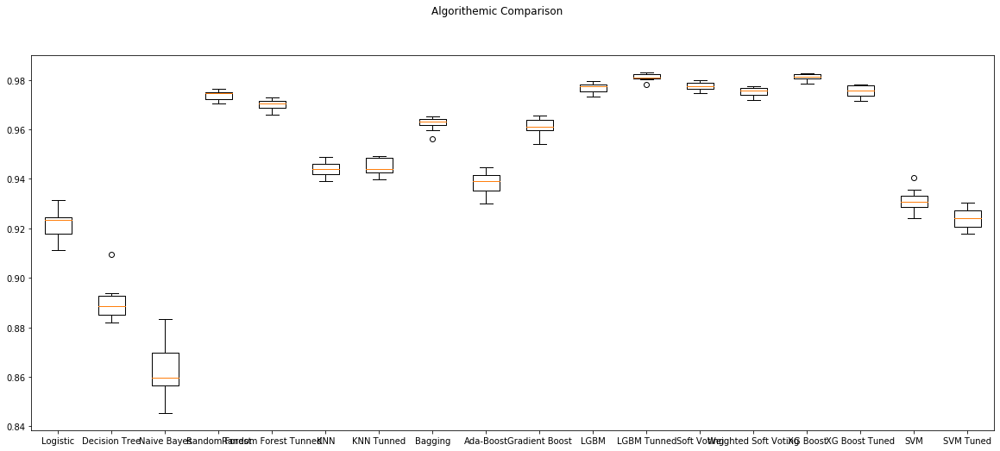

In [153]:
fig=plt.figure(figsize=(20,8))
fig.suptitle('Algorithemic Comparison')
ax=fig.add_subplot(111)
plt.boxplot(results_sm)
ax.set_xticklabels(names_sm)
plt.show()

# 7.CLUSTERING

Clustering is performed on our dataset to find shopping trends within the customers in the dataset. This is done in order to build “profiles” for incoming customers so that business can quickly compare them to other customers with similar characteristics from their database to assist for their reference.
2 clustering algorithms have been chosen for clustering.

1) k-modes

2) Hierarchical clustering

The main reason for choosing k-modes ahead of k-means was the exhaustive number of categorical features present in the dataset. k-modes is an extension of k-means. Instead of distances it uses dissimilarities (that is, quantification of the total mismatches between two objects: the smaller this number, the more similar the two objects). And instead of means, it uses modes. We could think of transforming our categorical values in numerical values and eventually apply k-means. But k-means uses numerical distances, so it could consider close two really distant objects that merely have been assigned two close numbers.
	k-modes does not provide the elbow plot which k-means has the luxury of. As a result, 3 clusters were chosen after going through the trial and error method for the number of clustering which contain unique pattern.

In [88]:
clust_df=df[['SpecialDay', 'Month',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'VisitorType',
       'Weekend']]

In [89]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
clust_df = clust_df.apply(le.fit_transform)
clust_df.head()

,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend
0,0,2,0,0,0,0,2,0
1,0,2,1,1,0,1,2,0
2,0,2,3,0,8,2,2,0
3,0,2,2,1,1,3,2,0
4,0,2,2,2,0,3,2,1


In [90]:
clust_df.SpecialDay.value_counts()

0    11079
3      351
4      325
2      243
1      178
5      154
Name: SpecialDay, dtype: int64

In [91]:
from kmodes.kmodes import KModes
km = KModes(n_clusters=3, init='Cao', n_init=1, verbose=1)
clusters = km.fit_predict(clust_df)

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 1089, cost: 34394.0


In [92]:
new_df = clust_df.copy()
new_df['labels'] = clusters
new_df.head()

,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,labels
0,0,2,0,0,0,0,2,0,1
1,0,2,1,1,0,1,2,0,0
2,0,2,3,0,8,2,2,0,1
3,0,2,2,1,1,3,2,0,0
4,0,2,2,2,0,3,2,1,2


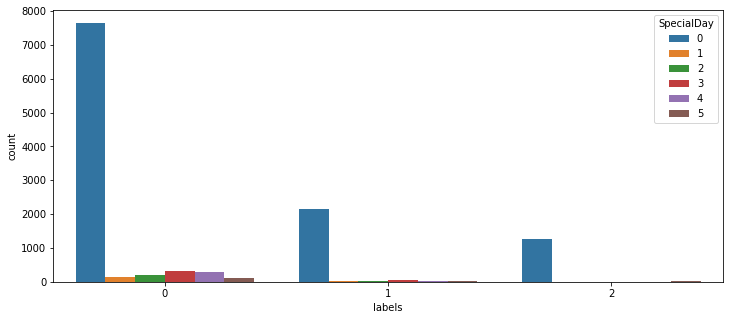

In [93]:
plt.figure(figsize=(12,5))
sns.countplot(new_df['labels'],hue=new_df['SpecialDay'])
plt.show()

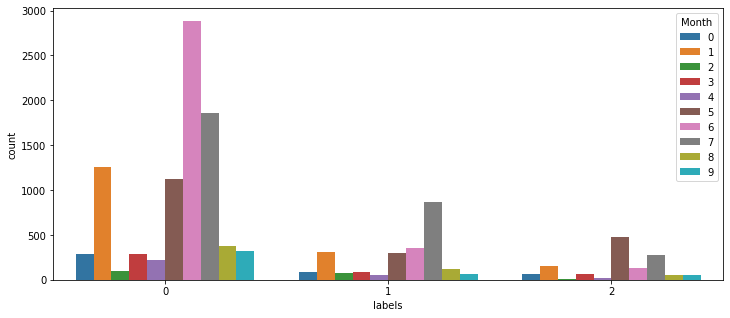

In [94]:
plt.figure(figsize=(12,5))
sns.countplot(new_df['labels'],hue=new_df['Month'])
plt.show()

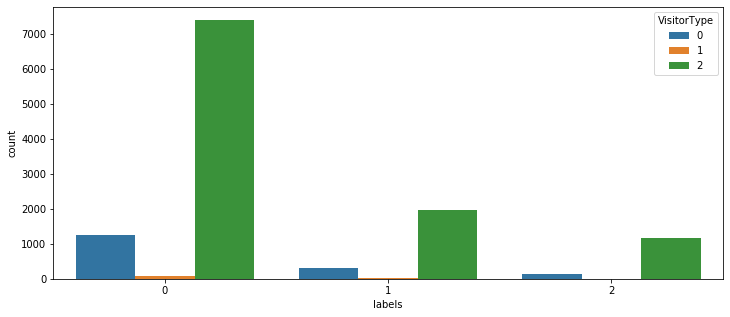

In [95]:
plt.figure(figsize=(12,5))
sns.countplot(new_df['labels'],hue=new_df['VisitorType'])
plt.show()

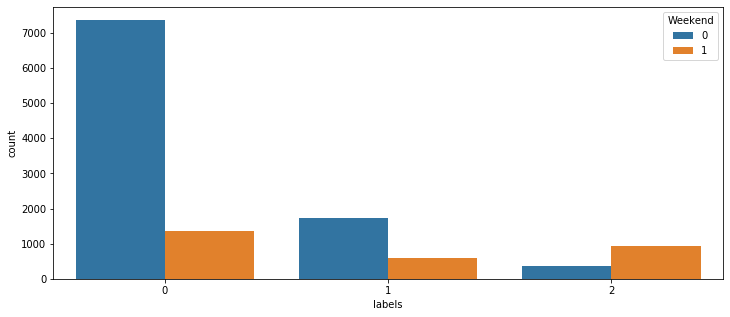

In [96]:
plt.figure(figsize=(12,5))
sns.countplot(new_df['labels'],hue=new_df['Weekend'])
plt.show()

**CONCLUSION FOR K-MODES**

**Cluster 0:**

1)Size = 8718

2)Special day trends: Similar trend has been observed in all 3 clusters. Most of the customers visited the website during all the times in the year and special days did not affect the usage.

3)Month: Trends are same for clusters 0 and 1. The month of May recorded the highest count.

4)Visitor type: The visitor type has the same trend across all the 3 clusters. Returning visitors dominate this cluster.

5)Weekend: Similar trend can be observed in the first 2 clusters. Most of the customers in this cluster don't belong to the weekend.

**Cluster 1:**

1)Size = 2307 

2)Special day trends: Similar trend has been observed in all 3 clusters. Most of the customers visited the website during all the times in the year and special days did not affect the usage. 
3)Month: The month of November recorded the highest count in this cluster followed by May.

4)Visitor type: The visitor type has the same trend across all the 3 clusters. Returning visitors dominate this cluster.

5)Weekend: Similar trend can be observed in the first 2 clusters. Most of the customers in this cluster don't belong to the weekend.

**Cluster 2:**

1)Size = 1305

2)Special day trends: Similar trend has been observed in all 3 clusters. Most of the customers visited the website during all the times in the year and special days did not affect the usage. 3)Month: The month of March recorded the highest count.

4)Visitor type: The visitor type has the same trend across all the 3 clusters. Returning visitors dominate this cluster.

5)Weekend: There is a change in the trend from the one observed in the first 2 clusters. Most of the customers in this cluster belong to the weekend category.


# Dendrogram

In [97]:
from scipy.cluster.hierarchy import dendrogram, linkage
import numpy as np
Z = linkage(X, 'complete')

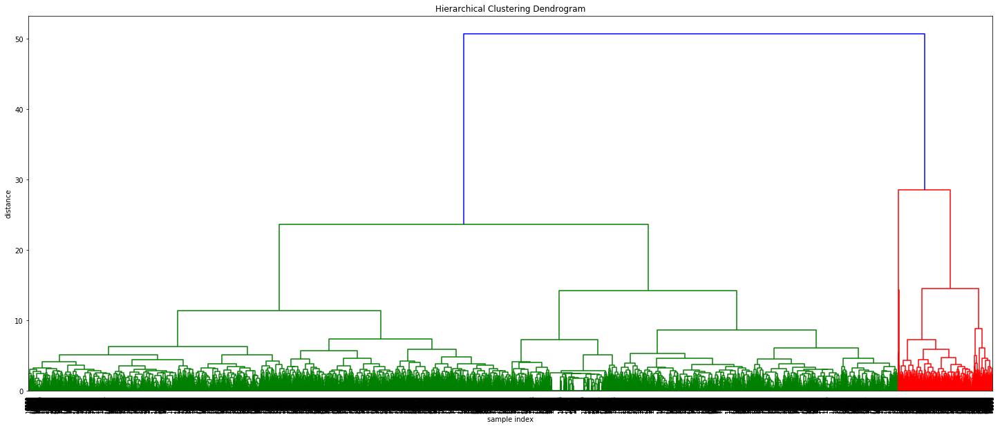

In [209]:
plt.figure(figsize=(25, 10))
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    Z,
    leaf_rotation=90.,  # rotates the x axis labels
    leaf_font_size=8.,  # font size for the x axis labels
)
plt.show()

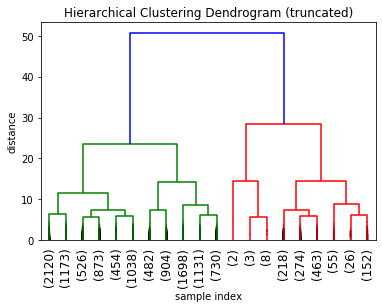

In [211]:
plt.title('Hierarchical Clustering Dendrogram (truncated)')
plt.xlabel('sample index')
plt.ylabel('distance')
dendrogram(
    Z,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=20,  # show only the last p merged clusters
    show_leaf_counts=True,  # otherwise numbers in brackets are counts
    leaf_rotation=90.,
    leaf_font_size=12.,
    show_contracted=True,  # to get a distribution impression in truncated branches
)
plt.show()

The algorithm starts by finding the two points that are nearby to each other on the basis of Euclidean distance.
Once one big cluster is formed, the longest vertical distance without any horizontal line passing through it is selected and a horizontal line is drawn through it. The number of vertical lines this newly created horizontal line passes is equal to number of clusters. 

# 8.BUSINESS INSIGHTS AND RECOMMENDATIONS

**1.FINAL MODEL SELECTION**

After comparing the models on three different metrics, it was determined that the XGBoost model (Without tuning) was the best model out of the ones built for this study. This was based on not just the model’s ability to predict accurately and have a low bias error, but also its low variance error and far lower execution time. After seeing the initial results, there were concerns of overfitting due to its high accuracy and precision. Upon cross validating AUC_ROC score, we found that the Tuned LightGBM model also had the lowest variance, suggesting that it also had the ability to adapt to changes in the data.
There were other models that performed but for one reason or another, were deemed inferior to the XGBoost model. The Tuned Random Forest model performed well in most metrics, but its high execution time (39.55 s) resulted it in not being a viable option. The Tuned LightGBM was the second-best model overall, due it clocking a 0.928 s execution time and bias and variance errors very similar to the XGBoost model.


**BEST MODEL**: XGBoost

**2.METHODOLOGICAL IMPROVEMENTS**

**a. Data Collection:**

One important thing to take away from this dataset is that it had too many categorical features. Addition of a few more numerical variables would be helpful in providing better inferences. Certain features were found out to be insignificant during the statistical significance tests. It would be advisable to drop those features during the upcoming data collection process. ExitRates proved to have been redundant because of the presence of BounceRates. Dropping them out would be wise from an economical perspective.

**b. Preprocessing:**

One hot encoding for the categorical features proved to be very exhaustive as the features themselves had too many numbers of sub-categories. This resulted in the increase of dimensionality. Other encoding methods can be tried out if there is a time availability constraint. The numerical features were found out to have a skewed distribution and primary transformations were applied to bring it into Gaussian distribution. Advanced transformation techniques can be experimented to treat the extreme values.

**c. Modeling:**

Many classification models were used for model building. Most of them resulted in models with a commendable ROC_AUC score. Hyper-parameters can be tuned if the improvement of f1-score is the intention. Neural Networks and other deep learning techniques can be used to build models which offer better generalization even though our models had a very considerate variance error. 


**3.Commercial /Research Value:**

**a.  Commercial:**

This study can be used to predict the intention of the online shopper. Our best models can be used for the same. PageValues have proved to be the most crucial feature for predicting the intention. Hence, pages with very high Page Values could be looked upon and the products corresponding to that pages could be considered as the hot selling products. On the contrary, pages with very less Page Values could indicate minimal contribution to the revenue generation. However, with the help of this insight, it is the company’s decision to retain that product or drop it from the website. BounceRates have been proved to be inversely proportional to the revenue generation. As a result, pages with high Bounce Rates could be managed better for better revenues. Month of November was found to have the highest revenue generation, which in turn would indicate the surge of customers. Attractive offers can be put up to attract more customers.

**b. Research Value:**

There is further cope for research with respect to the clustering techniques. As this dataset contained high number of categorical features, k-modes was applied. Other clustering techniques can be applied to finding out hidden patterns. This way, it could help in clusters with better similarity and certain products can be advertised to a specific cluster of shoppers.


# RECOMMENDATIONS BASED ON INSIGHTS

Taking into consideration of our analysis and understanding of the dataset, EDA and model performances, we recommend that an XGBoost model without hyper-parameter tuning with a dataset balanced using SMOTE is the best method to predict the online shopper’s intention. This conclusion was reached after comparing six different machine learning models on a dataset of standardized, one-hot and label encoded variables. The XGBoost classifier not only performed well in accuracy wise, with an accuracy of 93%, precision of 93% and recall of 93% and AUC Score of 98%, but also adjusted well to changes in dataset (low variance error) and took a far lower time to execute compared to more complex algorithms that performed the same.

Regarding the studies related to Data Science studies, it is to be made clear that this study can be used only for prediction purposes and decision making despite good mathematical results. Despite the impressive results, shopper’s behaviors and also the trend of the market may be subjected to changes in the upcoming days. That being said, the two objectives of our study can be used in different ways to be incorporated into am intention prediction.

Firstly, the important features can be used as a preliminary indicator of the intention of the shopper. The least important factors can be neglected during this process. Coming to the second objective, XGBoost model without tuning can be used for the same. Other five models have also proved to be a challenger but can be used for experimentation.
